In [133]:
import pandas as pd
import numpy as np
import nibabel as nib
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib as mpl

(np.float64(-0.5), np.float64(255.5), np.float64(0.5), np.float64(-0.5))

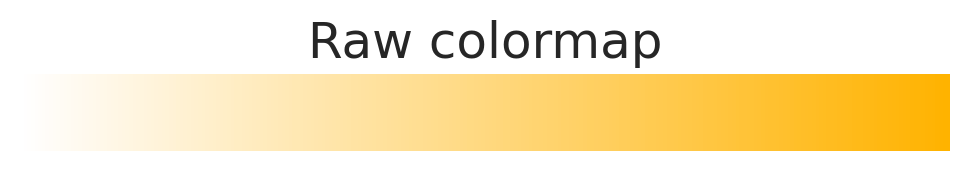

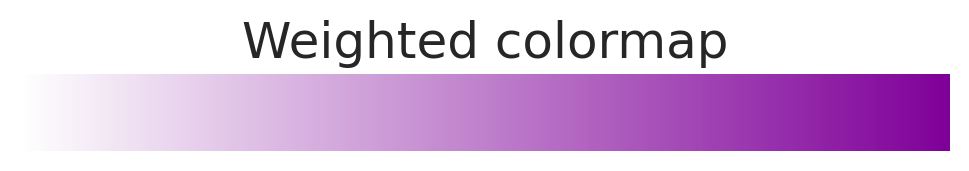

In [134]:
# ── Global visualisation configuration ──────────────────────────────────────

# 1.  General Matplotlib defaults
# ── Global visualisation configuration ──────────────────────────────────────
import matplotlib as mpl
import seaborn as sns

mpl.rcParams.update(
    {
        # ── Canvas size & resolution ───────────────────────────────────────────
        # Default figure size: 12×8 inches  →  4800×3200 px when exported at 400 dpi
        "figure.figsize": (12, 8),
        "figure.dpi": 200,  # crisp in-notebook / retina preview
        "savefig.dpi": 400,  # print-quality PNG/PDF
        # ── Fonts ──────────────────────────────────────────────────────────────
        "font.family": "sans-serif",
        "font.sans-serif": ["Roboto", "DejaVu Sans", "Arial"],
        "axes.titlesize": 24,
        # "axes.titleweight": "bold",
        "axes.labelsize": 24,
        "xtick.labelsize": 14,
        "ytick.labelsize": 14,
        "legend.fontsize": 20,
        # ── Axis & spine aesthetics ────────────────────────────────────────────
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.spines.left": True,
        "axes.spines.bottom": True,
        "axes.linewidth": 1,
        "axes.grid": True,
        "grid.color": "#E6E6E6",
        "grid.linewidth": 0.4,
        "grid.alpha": 0.8,
        # ── Colour cycle (colour-blind-safe) ───────────────────────────────────
        "axes.prop_cycle": mpl.cycler(color=sns.color_palette("Set2")),
        # ── Figure background ─────────────────────────────────────────────────
        "figure.facecolor": "white",
    }
)

# Seaborn theme inherits the rcParams above
sns.set_theme(context="talk", style="whitegrid", palette="Set2")


# 2.  Seaborn theme (inherits Matplotlib rcParams)
sns.set_theme(
    context="talk",  # slightly larger fonts for presentations / papers
    style="whitegrid",  # grid only on y-axis (good for histograms)
    palette="Set2",  # matches the rcParams colour cycle
)


# 3.  Helper function for consistent figure export
def savefig_nice(fig, filename, *, tight=True, dpi=300, **savefig_kwargs):
    """Save figure with tight layout and correct DPI."""
    if tight:
        fig.tight_layout()
    fig.savefig(filename, dpi=dpi, bbox_inches="tight", transparent=True, **savefig_kwargs)


# 4.  Colour constants for this project (optional convenience)
# COL_RAW = "#1f77b4"  # e.g. unweighted sample
COL_RAW = "#ffb300"
# COL_WEIGHTED = "#d62728"  # weighted sample
COL_WEIGHTED = "#7F0099CE"  # weighted sample
COL_REF = "0.25"  # census reference (neutral grey)
COL_CENSUS = "#A5A5A5"

# generate colormaps from white to colour
COL_WHITE = "white"
COL_RAW_RGB = mpl.colors.to_rgb(COL_RAW)
COL_WEIGHTED_RGB = mpl.colors.to_rgb(COL_WEIGHTED)
CMAP_RAW = mpl.colors.LinearSegmentedColormap.from_list("raw", [COL_WHITE, COL_RAW_RGB], N=256)
CMAP_WEIGHTED = mpl.colors.LinearSegmentedColormap.from_list(
    "weighted", [COL_WHITE, COL_WEIGHTED_RGB], N=256
)
# visualize the colormaps
# if __name__ == "__main__":
fig, ax = plt.subplots(figsize=(6, 0.5))
ax.imshow(np.linspace(0, 1, 256)[None, :], aspect="auto", cmap=CMAP_RAW)
ax.set_title("Raw colormap")
ax.axis("off")
# savefig_nice(fig, "colormap_raw.png")

fig, ax = plt.subplots(figsize=(6, 0.5))
ax.imshow(np.linspace(0, 1, 256)[None, :], aspect="auto", cmap=CMAP_WEIGHTED)
ax.set_title("Weighted colormap")
ax.axis("off")
# savefig_nice(fig, "colormap_weighted.png")

In [135]:
ATLAS = "schaefer2018tian2020_400_7"
region_col = "index"
# Load important files
DATA_DIR = Path("/home/groot/Projects/neuroaging/data")

# Output directory for figures
OUTPUT_DIR = Path("/home/groot/Projects/neuroaging/figures/fig4")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Load the data
parcels = pd.read_csv(DATA_DIR / "external" / "atlases" / ATLAS / "parcels.csv", index_col=0)
nifti = DATA_DIR / "external" / "atlases" / ATLAS / "atlas.nii.gz"
nifti_matlab = DATA_DIR / "external" / "atlases" / ATLAS / "atlas_matlab.nii"

In [136]:
metrics = ["gm_vol", "wm_vol", "csf_vol", "adc", "fa", "ad", "rd"]
distribution_metric = "qfmean"

bad_subjects = ["IN120120"]

# Load the data
data = {}
for metric in metrics:
    data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
        drop=True
    )
    # drop problematic subjects
    data[metric] = data[metric][~data[metric]["subject_code"].isin(bad_subjects)]
    data[metric]["sex"] = data[metric]["sex"].map({"M": 0, "F": 1})


# data["age_squared"] = data["age_at_scan"] ** 2

/tmp/ipykernel_42050/841459950.py:9: DtypeWarning: Columns (1,7,61,67,71,72,73,74,75,77,78,79,80,85,86,87,88,89,90,92,106,109,114,115,116,117) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_42050/841459950.py:9: DtypeWarning: Columns (1,7,61,67,71,72,73,74,75,77,78,79,80,85,86,87,88,89,90,92,106,109,114,115,116,117) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_42050/841459950.py:9: DtypeWarning: Columns (1,7,61,67,71,72,73,74,75,77,78,79,80,85,86,87,88,89,90,92,106,109,114,115,116,117) have mixed types. Specify dtype option on import or set low_memory=False.
  data[metric] = pd.read_csv(DATA_DIR / "processed" / f"{metric}.csv", index_col=0).reset_index(
/tmp/ipykernel_42050/841459950.py:9: DtypeWarning: Columns

In [137]:
metric_cols = {metric: "volume" if "vol" in metric else distribution_metric for metric in metrics}

for m, df in data.items():
    df = df.rename(columns={metric_cols[m]: "value"})
    data[m] = df

In [138]:
israel_population = pd.read_csv(DATA_DIR / "processed" / "israel_population.csv")

In [139]:
import numpy as np
import pandas as pd


# ─────────────────────────────────────────────────────────────────────────────
def compute_poststrat_weights(
    sample_df: pd.DataFrame,
    pop_df: pd.DataFrame,
    *,
    age_col: str = "age_at_scan",
    start_col: str = "range_start",
    end_col: str = "range_end",
    pop_total_col: str = "total",
    cap: float | None = None,
    return_bin_table: bool = False,
):
    """
    Post-stratification weights so that the age distribution of *sample_df*
    matches an external population distribution supplied in *pop_df*.

    Parameters
    ----------
    sample_df : DataFrame with an ``age_col`` column (years; int or float).
    pop_df    : DataFrame with columns
                    [start_col, end_col, pop_total_col].
                * Values in ``pop_total_col`` can be counts **or** percentages
                  (they are internally re-scaled to proportions).
                * The row order doesn’t matter; they will be sorted.
    cap       : Optional float.  If provided, weights are truncated at
                ``cap × mean(weight)`` and then re-scaled so mean(weight)=1.
    return_bin_table : If True, also return a DataFrame summarising
                       n_sample, n_pop, and weight_factor for every bin.

    Returns
    -------
    weights   : 1-D numpy array aligned with ``sample_df.index``.
    bin_table : (optional) tidy per-bin summary (see above).
    """

    # 1 ── tidy & validate the population table --------------------------------
    pop = (
        pop_df[[start_col, end_col, pop_total_col]]
        .dropna()
        .astype({start_col: int, end_col: int, pop_total_col: float})
        .sort_values(start_col)  # your CSV is descending; fix that
        .reset_index(drop=True)
    )

    if (pop[end_col] <= pop[start_col]).any():
        raise ValueError("Each range_end must exceed range_start.")

    if (pop[start_col].iloc[1:].values < pop[end_col].iloc[:-1].values).any():
        overlap = pop.iloc[
            np.where(pop[start_col].iloc[1:].values < pop[end_col].iloc[:-1].values)[0] + 1
        ][[start_col, end_col]]
        raise ValueError(
            "Age bins overlap (rows shown below) — "
            "merge / correct them before weighting:\n"
            f"{overlap}"
        )

    # 2 ── build right-inclusive bin edges  (···| s_i  …  e_i | s_{i+1} …) ----
    edges = pop[start_col].tolist() + [pop[end_col].iloc[-1]]

    # 3 ── assign every participant to a bin -----------------------------------
    s_bins = pd.cut(
        sample_df[age_col],
        bins=edges,
        right=True,
        include_lowest=True,
        labels=pop.index,  # categorical labels 0,1,…
    )

    # 4 ── compute *sample* and *population* proportions per bin --------------
    n_sample = s_bins.value_counts(sort=False).sort_index()
    prop_sample = n_sample / n_sample.sum()

    prop_pop = pop[pop_total_col] / pop[pop_total_col].sum()

    # 5 ── weight factor = pop_prop / sample_prop ------------------------------
    weight_factor = prop_pop / prop_sample.replace(0, np.nan)  # avoid /0 → NaN

    # 6 ── map factor back to each row ----------------------------------------
    w = s_bins.map(weight_factor).astype(float).to_numpy()
    w = np.where(np.isnan(w), 0.0, w)  # rows that fell outside bins → 0

    # 7 ── optional weight truncation (winsorisation) --------------------------
    if cap is not None and cap > 0:
        mean_pos = w[w > 0].mean()
        w = np.clip(w, 0, cap * mean_pos)

    # 8 ── re-scale so mean(weight > 0) == 1 -----------------------------------
    positive = w > 0
    w[positive] = w[positive] / w[positive].mean()

    # 9 ── return --------------------------------------------------------------
    if return_bin_table:
        bin_tbl = pd.DataFrame(
            {
                "n_sample": n_sample,
                "n_pop": prop_pop * n_sample.sum(),  # rescaled to sample size
                "prop_sample": prop_sample,
                "prop_pop": prop_pop,
                "weight_factor": weight_factor,
            }
        )
        return w, bin_tbl

    return w

In [140]:
# assign weights
for metric in metrics:
    data[metric]["weight"], _ = compute_poststrat_weights(
        data[metric],
        israel_population,
        age_col="age_at_scan",
        cap=None,  # try None first; if still spiky, use 4 or 5
        return_bin_table=True,
    )
    data[metric]["subject_code"] = data[metric]["subject_code"].astype(str).str.zfill(4)

In [141]:
# df_long = data["adc"].copy()
# df_long[df_long["subject_code"] == 447]["subject_code"]

In [142]:
import pandas as pd
from functools import reduce


def long_to_wide(
    long_df,
    *,
    index="subject_code",
    columns=region_col,
    values="value",
):
    """Pivot a long metric table → wide DataFrame (subjects × regions)."""
    wide = long_df.pivot_table(index=index, columns=columns, values=values, aggfunc="first")
    # Optional: drop regions with >20 % missing values
    thresh = int(0.8 * len(wide))
    wide = wide.dropna(axis=1, thresh=thresh)
    # Optional: drop subejcts with >20 % missing values
    thresh = int(0.8 * len(parcels))
    wide = wide.dropna(axis=0, thresh=thresh)
    return wide


def prep_metric_matrices(metric_dict, *, index="subject_code"):
    """
    Parameters
    ----------
    metric_dict : {metric_name: long_df}
        Each DataFrame must include `subject_id`, `region`, `value`,
        `age_at_scan`, and any covariates you want.
    Returns
    -------
    X_dict : {metric_name: ndarray}
             Wide feature matrices aligned on the *intersection* of subjects.
    y, w, cov_df : Series / ndarray
             Age, weights, and any extra covariates for the same subjects.
    """
    # 1.  Convert every long → wide
    wide_dict = {m: long_to_wide(df) for m, df in metric_dict.items()}

    # 2.  Intersect subject index across all metrics
    common_subs = reduce(pd.Index.intersection, [w.index for w in wide_dict.values()])

    # 3.  Slice & order every matrix
    for m in wide_dict:
        wide_dict[m] = wide_dict[m].loc[common_subs]

    # 4.  Pull y, w, covariates from *any* of the long dfs (they all duplicate)
    ref_long = next(iter(metric_dict.values()))
    ref_meta = (
        ref_long.drop_duplicates(subset=index)  # one row per subject
        .set_index(index)
        .loc[common_subs]
    )
    y = ref_meta["age_at_scan"]
    w = ref_meta.get("weight", pd.Series(1.0, index=common_subs))
    cov = ref_meta[ref_meta.columns.difference(["age_at_scan", "weight"])]

    # 5.  Convert features to numpy (sklearn ready)
    X_dict = {m: wide.to_numpy() for m, wide in wide_dict.items()}
    return X_dict, y.to_numpy(), w.to_numpy(), cov

In [143]:
# -------------------------------------------------------
# Build (X, y, w, cov) once, re-use in every metric loop
# -------------------------------------------------------
X_dict, y, w, cov = prep_metric_matrices(data)
# y_mean = y.mean()
# y = y - y_mean  # center the target variable
# Example list of covariates you want to *keep* (z-scored later if needed)
cov_names = {
    m: ["sex"] if "vol" not in m else ["sex", "tiv"] for m in metrics
}  # e.g. ["sex", "tiv"]

In [144]:
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import PolynomialFeatures

def cole_bias_correction(y_train, y_tr_pred, y_te_pred, degree=1):
    """
    The technique proposed by Cole et al. is to use the slope and intercept of a linear regression model of estimated brain age versus chronological age obtained from training results(Cole et al., 2018). Indeed, for each sample under study, the bias-free Brain-age value was achieved by subtracting the intercept from predicted brain age and then divided by the slope of a linear regression model of estimated brain age on chronological age obtained from the training set

    Parameters
    ----------
    y_train : np.ndarray
        True ages for the training set.
    y_tr_pred : np.ndarray
        Predicted ages for the training set.
    y_te_pred : np.ndarray
        Predicted ages for the test set.

    Returns
    -------
    np.ndarray
        Bias-corrected predicted ages for the test set.
    """
    # Fit a linear regression model to the training data
    model = LinearRegression()
    model.fit(y_train.reshape(-1, 1), y_tr_pred)
    a = model.coef_[0]  # slope
    b = model.intercept_  # intercept

    # Apply the correction to the test set predictions
    y_te_corrected = (y_te_pred - b) / a

    return y_te_corrected


def beheshti_bias_correction(y_train, y_tr_pred, y_te_pred, degree=1):
    """
    The technique proposed by Beheshti et al. is to use a linear regression model to fit the difference between predicted and true ages on the training set, and then apply this correction to the test set predictions.

    Parameters
    ----------
    y_train : np.ndarray
        True ages for the training set.
    y_tr_pred : np.ndarray
        Predicted ages for the training set.
    y_te_pred : np.ndarray
        Predicted ages for the test set.

    Returns
    -------
    np.ndarray
        Bias-corrected predicted ages for the test set.
    """
    # Fit a linear regression model to the training data
    poly = PolynomialFeatures(degree=degree, include_bias=True)
    estimator = LinearRegression()
    model = Pipeline([("poly", poly), ("est", estimator)])
    offset = y_tr_pred - y_train
    model.fit(y_train.reshape(-1, 1), offset)

    # Apply the correction to the test set predictions
    y_te_corrected = y_te_pred - model.predict(y_te_pred.reshape(-1, 1))

    return y_te_corrected



def delange_correction(y_train, y_tr_pred, y_te_pred, y_te_true):
    model = LinearRegression().fit(y_train.reshape(-1, 1), y_tr_pred)
    alpha = model.coef_[0]
    beta = model.intercept_
    correction = y_te_true - (alpha * y_te_true + beta)
    y_te_corrected = y_te_pred + correction
    return y_te_corrected



def beheshti_correction(y_train, y_tr_pred, y_te_pred, y_te_true):
    delta = y_tr_pred - y_train
    model = LinearRegression().fit(y_train.reshape(-1, 1), delta)
    alpha = model.coef_[0]
    beta = model.intercept_
    bias = alpha * y_te_true + beta
    y_te_corrected = y_te_pred - bias
    return y_te_corrected

In [145]:
import numpy as np
from joblib import Parallel, delayed
from sklearn.utils import indexable
from sklearn.model_selection import check_cv
from sklearn.base import clone, is_classifier
from sklearn.utils.validation import _num_samples
import scipy.sparse as sp


def _fit_predict_correct(estimator, X, y, train, test, fit_params, method, correction_func):
    est = clone(estimator)
    X_train, X_test = X[train], X[test]
    y_train, y_test = y[train], y[test]

    # Subset fit_params containing sample_weight (and any other sample-aligned params)
    fit_params_fold = {}
    for k, v in fit_params.items():
        if v is not None and hasattr(v, "__len__") and len(v) == len(y):
            # If this param looks like sample_weights, subset by train indices
            fit_params_fold[k] = v[train]
        else:
            fit_params_fold[k] = v

    est.fit(X_train, y_train, **fit_params_fold)
    y_train_pred = getattr(est, method)(X_train)
    y_test_pred = getattr(est, method)(X_test)
    y_test_pred_corr = correction_func(y_train, y_train_pred, y_test_pred, y_test)
    return y_test_pred_corr


def corrected_cross_val_predict(
    estimator,
    X,
    y=None,
    *,
    groups=None,
    cv=None,
    n_jobs=None,
    verbose=0,
    params=None,
    pre_dispatch="2*n_jobs",
    method="predict",
    correction_func=None,
):
    """
    Generate cross-validated, *bias-corrected* predictions for each input data point.

    This function works just like sklearn's cross_val_predict, but applies the supplied correction_func
    after each split's model is fit and before predictions are returned. The correction_func
    must have the signature:
        y_test_corr = correction_func(y_train, y_train_pred, y_test_pred, y_test)
    """

    X, y, groups = indexable(X, y, groups)
    if params is None:
        params = {}

    cv = check_cv(cv, y, classifier=is_classifier(estimator))
    splits = list(cv.split(X, y, groups))

    test_indices = np.concatenate([test for _, test in splits])
    if np.unique(test_indices).size != _num_samples(X):
        raise ValueError(
            "cross_val_predict only works for partition splits (all samples must appear in exactly one test set)"
        )

    fit_params = params if params is not None else {}

    parallel = Parallel(n_jobs=n_jobs, verbose=verbose, pre_dispatch=pre_dispatch)

    predictions = parallel(
        delayed(_fit_predict_correct)(
            estimator, X, y, train, test, fit_params, method, correction_func
        )
        for train, test in splits
    )

    # Reassemble predictions according to test indices (as in sklearn)
    inv_test_indices = np.empty(len(test_indices), dtype=int)
    inv_test_indices[test_indices] = np.arange(len(test_indices))

    if sp.issparse(predictions[0]):
        predictions = sp.vstack(predictions, format=predictions[0].format)
    else:
        predictions = np.concatenate(predictions)

    return predictions[inv_test_indices]

In [146]:
CORRECTION_METHODS = {
    "cole": cole_bias_correction,
    "beheshti": beheshti_bias_correction,
    "delange": beheshti_bias_correction,  # same as Beheshti
}

In [147]:
import numpy as np
from scipy.stats import pearsonr, spearmanr
from sklearn.base import BaseEstimator, RegressorMixin, clone
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.metrics import r2_score, mean_absolute_error, get_scorer
from sklearn.utils.validation import check_is_fitted, check_X_y, check_array
from sklearn.model_selection import train_test_split
import warnings


class BiasCorrectedRegressor(RegressorMixin, BaseEstimator):
    """
    A scikit-learn compatible regressor that applies bias correction for brain age prediction,
    using a nested validation approach to train the bias model, inspired by de Lange/Beheshti
    and polynomial methods. Supports linear or polynomial correction on predicted or chronological age.

    Parameters:
    - base_estimator: object, default=LinearRegression()
        A scikit-learn compatible estimator (e.g., Ridge, SVR, RandomForestRegressor).
    - correction_type: str, default='linear'
        Type of bias correction: 'linear' (de Lange/Beheshti-style) or 'polynomial'.
    - degree: int, default=2
        Degree of polynomial for 'polynomial' correction. Ignored if correction_type='linear'.
        Use 1 for linear, 2-3 for nonlinear. Higher degrees may overfit with small datasets.
    - age_variable: str, default='predicted'
        Variable for bias modeling: 'predicted' (predicted age) or 'chronological' (true age).
        'Chronological' is more standard per literature for age-level corrections.
    - scorer: str or callable, default='r2'
        Scoring function for the score method (e.g., 'r2', 'neg_mean_absolute_error').
    - apply_correction: bool, default=True
        If True, apply bias correction. If False, return raw predictions.
    - val_size: float, default=0.2
        Proportion of training data for validation in nested CV.

    Attributes:
    - base_estimator_: object
        Fitted base estimator.
    - bias_model_: object
        Fitted bias correction model (LinearRegression or Pipeline).
    - age_scaler_: StandardScaler
        Scaler for normalizing ages (if polynomial correction).
    - y_train_: array
        Training chronological ages.

    Notes:
    - Uses nested validation to train the bias model, preventing leakage and improving OOF performance.
    - For 'linear' correction, fits BAG = alpha2 * chronological_age + beta2, corrects as pred - (alpha2 * chronological + beta2).
    - For 'polynomial' correction, models BAG as a polynomial of predicted or chronological age, subtracts the fitted bias.
    - Requires y_chron in predict for correction. If unavailable, returns raw predictions with a warning.
    - For SHAP:
        ```python
        import shap
        model = BiasCorrectedRegressor(base_estimator=Ridge())
        model.fit(X_train, y_train)
        def predict_fixed(X): return model.predict(X, y_chron=y_test)
        explainer = shap.KernelExplainer(predict_fixed, X_train)
        shap_values = explainer(X_test)
        ```
    - For permutation importance:
        ```python
        from sklearn.inspection import permutation_importance
        results = permutation_importance(model, X_test, y_test, scoring='r2')
        ```

    Example:
    ```python
    from sklearn.linear_model import Ridge
    model = BiasCorrectedRegressor(base_estimator=Ridge(alpha=1.0), correction_type='linear')
    model.fit(X_train, y_train)  # X_train: (n_samples, 400) GM volumes
    y_pred = model.predict(X_test, y_chron=y_test)
    print("Metrics:", model.get_metrics(X_test, y_test))
    ```
    """

    def __init__(
        self,
        base_estimator=LinearRegression(),
        correction_type: str = "cole",  # correction_type: 'cole' or 'beheshti' / 'delange' or None
        degree=1,
    ):
        self.base_estimator = base_estimator
        self.correction_type = correction_type
        self.degree = degree

    def fit(self, X, y, sample_weight=None):
        """
        Fit the base estimator and bias correction model using nested validation.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Training features (e.g., brain imaging data).
        - y: array-like of shape (n_samples,)
            Chronological ages.
        - sample_weight: array-like of shape (n_samples,), optional
            Sample weights for base estimator.

        Returns:
        - self
        """
        X, y = check_X_y(X, y, accept_sparse=True)
        if sample_weight is not None:
            sample_weight = check_array(sample_weight, ensure_2d=False)

        # Fit the base estimator
        self.base_estimator_ = clone(self.base_estimator)
        self.base_estimator_.fit(X, y, sample_weight=sample_weight)

        self.y_train_ = y.copy()
        self.X_train_ = X.copy()
        return self

    def predict(self, X):
        """
        Predict corrected brain ages.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Features for prediction.
        - y_chron: array-like of shape (n_samples,), optional
            Chronological ages for correction. Required if apply_correction=True.

        Returns:
        - array-like of shape (n_samples,)
            Corrected brain age predictions (or raw if apply_correction=False or y_chron=None).
        """
        X = check_array(X, accept_sparse=True)
        check_is_fitted(self, ["base_estimator_"])

        y_te_pred = self.base_estimator_.predict(X)

        if self.correction_type in ["none", None]:
            return y_te_pred

        y_tr_pred = self.base_estimator_.predict(self.X_train_)
        correction_func = CORRECTION_METHODS.get(self.correction_type)
        if correction_func is None:
            raise ValueError(
                f"Unknown correction type '{self.correction_type}'. "
                "Available methods: " + ", ".join(CORRECTION_METHODS.keys())
            )
        return correction_func(
            self.y_train_,
            y_tr_pred,
            y_te_pred,
            degree=self.degree,
        )

    def score(self, X, y):
        """
        Compute the score for corrected predictions.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Test features.
        - y: array-like of shape (n_samples,)
            Chronological ages.

        Returns:
        - float
            Score of corrected predictions.
        """
        check_is_fitted(self, ["base_estimator_"])
        y_pred = self.predict(X)
        return self.scorer(y, y_pred)

    def get_metrics(self, X, y):
        """
        Compute metrics including Pearson/Spearman correlations and MAE between BAG and age.

        Parameters:
        - X: array-like of shape (n_samples, n_features)
            Test features.
        - y: array-like of shape (n_samples,)
            Chronological ages.

        Returns:
        - dict
            Metrics including Pearson/Spearman correlations, p-values, and MAE.
        """
        check_is_fitted(self, ["base_estimator_"])
        y_pred = self.predict(X)
        bag = y_pred - y
        pearson_corr, pearson_p = pearsonr(bag, y) if len(y) >= 2 else (np.nan, np.nan)
        spearman_corr, spearman_p = spearmanr(bag, y) if len(y) >= 2 else (np.nan, np.nan)
        mae = mean_absolute_error(y, y_pred)
        return {
            "pearson": {"correlation": pearson_corr, "p_value": pearson_p},
            "spearman": {"correlation": spearman_corr, "p_value": spearman_p},
            "mae": mae,
        }

In [148]:
from sklearn.base import clone
import numpy as np


def manual_cross_val_predict(model, X, y, cv, sample_weight=None):
    """
    Perform manual cross-validation predictions to get out-of-fold (OOF) predictions.

    This clones and fits the model on each train fold, then predicts on the val fold.
    If apply_correction is True, uses y_chron=y_val for corrected predictions.

    Parameters:
    - model: The pipeline or estimator to use (must have fit and predict methods).
    - X: Features (array-like).
    - y: Targets/chronological ages (array-like).
    - cv: Cross-validation splitter (e.g., KFold instance).
    - sample_weight: Optional sample weights (array-like).
    - apply_correction: Bool, if True, apply bias correction (requires y_chron).

    Returns:
    - oof_preds: Array of OOF predictions (same length as y).
    """
    oof_preds = np.zeros(len(y))

    for train_idx, val_idx in cv.split(X):
        pipeline_clone = clone(model)
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        fit_params = {}
        if sample_weight is not None:
            w_train = sample_weight[train_idx]
            fit_params["estimator__sample_weight"] = w_train

        pipeline_clone.fit(X_train, y_train, **fit_params)

        oof_preds[val_idx] = pipeline_clone.predict(X_val)
        # if apply_correction:
        # else:
        #     oof_preds[val_idx] = pipeline_clone.predict(X_val)

    return oof_preds

In [149]:
from sklearn.model_selection import KFold


def cross_val_predict_corrected(model, X, y, cv=5, sample_weight=None):
    """
    Compute bias-corrected out-of-fold (OOF) predictions using cross-validation.
    This fits the base estimator and bias correction model within each fold to avoid data leakage.

    Parameters:
    - model: BiasCorrectedRegressor
        The BiasCorrectedRegressor instance (with apply_correction=True).
    - X: array-like of shape (n_samples, n_features)
        Features (e.g., GM volumes).
    - y: array-like of shape (n_samples,)
        Chronological ages.
    - cv: int or cross-validation generator, default=5
        Number of folds or a CV splitter (e.g., KFold(n_splits=5)).
    - sample_weight: array-like of shape (n_samples,), optional
        Sample weights.

    Returns:
    - y_oof_pred: array of shape (n_samples,)
        Bias-corrected OOF predictions.
    """
    if not isinstance(cv, KFold):
        cv = KFold(n_splits=cv)

    y_oof_pred = np.zeros(len(y))

    for train_idx, val_idx in cv.split(X):
        X_train, X_val = X[train_idx], X[val_idx]
        y_train, y_val = y[train_idx], y[val_idx]

        if sample_weight is not None:
            sw_train = sample_weight[train_idx]
            fit_params = {"estimator__sample_weight": sw_train}
        else:
            sw_train = None
            fit_params = {}

        # Clone and fit model on train fold
        fold_model = clone(model)
        fold_model.fit(X_train, y_train, **fit_params)

        # Predict corrected on val fold
        y_val_pred = fold_model.predict(X_val)

        y_oof_pred[val_idx] = y_val_pred

    return y_oof_pred

In [150]:
import numpy as np, pandas as pd
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectPercentile
from sklearn.linear_model import (
    ElasticNet,
    RidgeCV,
    ElasticNetCV,
    LassoCV,
    Ridge,
    Lasso,
    SGDRegressor,
)

# xgb
from sklearn.ensemble import GradientBoostingRegressor, HistGradientBoostingRegressor
from sklearn.preprocessing import FunctionTransformer, RobustScaler
from sklearn.model_selection import GridSearchCV, KFold, cross_val_predict
from sklearn.metrics import r2_score, mean_absolute_error, root_mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
import xgboost as xgb

metric = "gm_vol"
X = X_dict[metric]

alphas = np.logspace(-3, 4, 30)  # ridge λ grid

outer_cv = KFold(
    n_splits=10,
    # shuffle=True,
    # random_state=1,
)

ESTIMATORS = {
    "ElasticNet": ElasticNet(max_iter=int(1e6)),
    "Ridge": Ridge(),
    "Lasso": Lasso(max_iter=int(1e6)),
    "HistGB": HistGradientBoostingRegressor(),
    "xgboost": xgb.XGBRegressor(
        n_estimators=1000,
        max_depth=3,
        learning_rate=0.1,
        subsample=0.8,
        colsample_bytree=0.8,
        random_state=42,
    ),
}

PARAM_GRIDS = {
    "ElasticNet": {
        "estimator__base_estimator__l1_ratio": [0.2, 0.5, 0.9, 1.0],  # l1_ratio for ElasticNet
        "estimator__base_estimator__alpha": alphas,  # alpha for ElasticNet
    },
    "Ridge": {
        "estimator__base_estimator__alpha": alphas,  # alpha for Ridge
    },
    "Lasso": {
        "estimator__base_estimator__alpha": alphas,  # alpha for Lasso
    },
    "HistGB": {
        "estimator__base_estimator__max_iter": [100, 200, 300],
        "estimator__base_estimator__max_depth": [3, 5, 7],
        "estimator__base_estimator__learning_rate": [0.01, 0.1, 0.2],
    },
    "xgboost": {
        "estimator__base_estimator__n_estimators": [100, 200, 300],
        "estimator__base_estimator__max_depth": [3, 5, 7],
        "estimator__base_estimator__learning_rate": [0.01, 0.1, 0.2],
        "estimator__base_estimator__subsample": [0.8, 1.0],
        "estimator__base_estimator__colsample_bytree": [0.8, 1.0],
    },
}
# Choose model and define parameter grid(s)
estimator_name = "Lasso"  # Example: using xgboost
base_estimator = ESTIMATORS[estimator_name]  # xgboost model
param_grid = PARAM_GRIDS[estimator_name]  # xgboost grid

# param_grid.update({
#     "pca__n_components": [0.7, 0.8, 0.9, X.shape[1]],  # PCA components
# })

# pca = PCA(n_components=0.9, random_state=42)  # PCA for dimensionality reduction

scaler = RobustScaler()

estimator = BiasCorrectedRegressor(
    base_estimator=base_estimator,
    # correction_type="beheshti" if apply_correction else "none",  # correction type
    correction_type="none",
    degree=1,  # degree of polynomial for correction (1 for linear)
    # degree=3,
    # post_hoc_correction=(post_hoc_degree > 0),
    # correction_method = "linear" if post_hoc_degree == 1 else "none",
    # use_weights=use_weights,
    # cv=outer_cv
)

pipeline = Pipeline(
    [
        ("scaler", scaler),  # StandardScaler for feature scaling
        # ("pca", pca),  # PCA for dimensionality reduction
        ("estimator", estimator),  # Base estimator (e.g., xgboost)
    ]
)

grid = GridSearchCV(
    pipeline,
    param_grid=param_grid,
    cv=5,
    scoring="neg_mean_absolute_error",
    n_jobs=4,
    refit=True,
    verbose=1,
)

In [151]:
# weighting_predictions = {}
# weighting_rows = []


# for [apply_correction, use_weights, key] in [
#     (False, False, "baseline"),
#     (False, True, "weighted"),
#     (True, False, "linear_ph"),
#     (True, True, "combined"),
# ]:
#     # Optionally concatenate covariates
#     covariates = cov_names[metric]
#     if cov_names:
#         X_model = np.hstack([X, cov[covariates].to_numpy()])
#     else:
#         X_model = X

#     estimator = BiasCorrectedRegressor(
#         base_estimator=base_estimator,
#         # correction_type="beheshti" if apply_correction else "none",  # correction type
#         correction_type="none",
#         degree=1,  # degree of polynomial for correction (1 for linear)
#         # degree=3,
#         # post_hoc_correction=(post_hoc_degree > 0),
#         # correction_method = "linear" if post_hoc_degree == 1 else "none",
#         # use_weights=use_weights,
#         # cv=outer_cv
#     )

#     pipeline = Pipeline(
#         [
#             ("scaler", scaler),  # StandardScaler for feature scaling
#             # ("pca", pca),  # PCA for dimensionality reduction
#             ("estimator", estimator),  # Base estimator (e.g., xgboost)
#         ]
#     )

#     grid = GridSearchCV(
#         pipeline,
#         param_grid=param_grid,
#         cv=5,
#         scoring="neg_mean_absolute_error",
#         n_jobs=4,
#         refit=True,
#         verbose=1,
#     )
#     # Fit the model
#     grid.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
#     model = grid.best_estimator_

#     # y_pred = model.predict(X_model, **{"y_chron": y} if apply_correction else {})
#     y_pred = cross_val_predict(
#         model,
#         X_model,
#         y,
#         cv=outer_cv,
#         params={"estimator__sample_weight": w if use_weights else None},
#     )

#     # y_pred = cross_val_predict_corrected(
#     #     model=model,
#     #     X=X_model,
#     #     y=y,
#     #     cv=outer_cv,
#     #     sample_weight=w if use_weights else None,
#     #     # apply_correction=apply_correction,
#     # )
#     residuals = y_pred - y
#     predictions_df = cov.copy()
#     predictions_df["True"] = y
#     predictions_df["Predicted"] = y_pred
#     # predictions_df["raw_residuals"] = original_residuals
#     predictions_df["corrected_residuals"] = residuals
#     weighting_predictions[key] = predictions_df
#     weighting_rows.append(
#         dict(
#             key=key,
#             model=model,
#             # R2=r2_score(y, y_pred, sample_weight=w if use_weights else None),
#             # MAE=mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None),
#             # RMSE=root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None),
#             R2=r2_score(y, y_pred),
#             R2_weighted=r2_score(y, y_pred, sample_weight=w),
#             MAE=mean_absolute_error(y, y_pred),
#             MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
#             RMSE=root_mean_squared_error(y, y_pred),
#             RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
#         )
#     )
#     # break

#     # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_posthoc(
#     #     model=model,
#     #     X=X_model,
#     #     y=y,
#     #     w=w,
#     #     cv=outer_cv,
#     #     use_weights=use_weights,
#     #     post_hoc_degree=post_hoc_degree,
#     # )

#     # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
#     #     model=model,
#     #     X=X_model,
#     #     y_chronological=y,
#     #     w=w,
#     #     cv=outer_cv,
#     #     use_weights=use_weights,
#     #     post_hoc_degree=post_hoc_degree,
#     #     # residual_orthog_degree=post_hoc_degree,
#     # )

#     # # # Save predictions
#     # predictions_df = cov.copy()
#     # predictions_df["True"] = y
#     # predictions_df["Predicted"] = y_pred
#     # predictions_df["raw_residuals"] = original_residuals
#     # predictions_df["corrected_residuals"] = corrected_residuals
#     # weighting_predictions[key] = predictions_df
#     # weighting_rows.append(
#     #     dict(
#     #         key=key,
#     #         # R2=r2_score(y, y_pred, sample_weight=w if use_weights else None),
#     #         # MAE=mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None),
#     #         # RMSE=root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None),
#     #         R2=r2_score(y, y_pred),
#     #         R2_weighted=r2_score(y, y_pred, sample_weight=w),
#     #         MAE=mean_absolute_error(y, y_pred),
#     #         MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
#     #         RMSE=root_mean_squared_error(y, y_pred),
#     #         RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
#     #     )
#     # )

In [152]:
weighting_predictions = {}
weighting_rows = []


for [use_weights, key] in [
    (False, "baseline"),
    (True, "weighted"),
]:
    # Optionally concatenate covariates
    covariates = cov_names[metric]
    if cov_names:
        X_model = np.hstack([X, cov[covariates].to_numpy()])
    else:
        X_model = X

    
    # Fit the model
    grid.fit(X_model, y, estimator__sample_weight=w if use_weights else None)
    model = grid.best_estimator_

    # y_pred = model.predict(X_model, **{"y_chron": y} if apply_correction else {})
    y_pred = cross_val_predict(
        model,
        X_model,
        y,
        cv=outer_cv,
        params={"estimator__sample_weight": w if use_weights else None},
    )

    # y_pred = cross_val_predict_corrected(
    #     model=model,
    #     X=X_model,
    #     y=y,
    #     cv=outer_cv,
    #     sample_weight=w if use_weights else None,
    #     # apply_correction=apply_correction,
    # )
    residuals = y_pred - y
    predictions_df = cov.copy()
    predictions_df["True"] = y
    predictions_df["Predicted"] = y_pred
    # predictions_df["raw_residuals"] = original_residuals
    predictions_df["corrected_residuals"] = residuals
    weighting_predictions[key] = predictions_df
    weighting_rows.append(
        dict(
            key=key,
            model=model,
            # R2=r2_score(y, y_pred, sample_weight=w if use_weights else None),
            # MAE=mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None),
            # RMSE=root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None),
            R2=r2_score(y, y_pred),
            R2_weighted=r2_score(y, y_pred, sample_weight=w),
            MAE=mean_absolute_error(y, y_pred),
            MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
            RMSE=root_mean_squared_error(y, y_pred),
            RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
        )
    )
    
    # apply correction
    correction_key = "linear_ph" if key == "baseline" else "combined"
    y_pred_corr = corrected_cross_val_predict(
        estimator=model,
        X=X_model,
        y=y,
        cv=outer_cv,
        params={"estimator__sample_weight": w if use_weights else None},
        correction_func=beheshti_correction
    )
    residuals_corr = y_pred_corr - y
    predictions_df_corr = cov.copy()
    predictions_df_corr["True"] = y
    predictions_df_corr["Predicted"] = y_pred_corr
    predictions_df_corr["corrected_residuals"] = residuals_corr
    weighting_predictions[correction_key] = predictions_df_corr
    weighting_rows.append(
        dict(
            key=correction_key,
            model=model,
            # R2=r2_score(y, y_pred_corr, sample_weight=w if use_weights else None),
            # MAE=mean_absolute_error(y, y_pred_corr, sample_weight=w if use_weights else None),
            # RMSE=root_mean_squared_error(y, y_pred_corr, sample_weight=w if use_weights else None),
            R2=r2_score(y, y_pred_corr),
            R2_weighted=r2_score(y, y_pred_corr, sample_weight=w),
            MAE=mean_absolute_error(y, y_pred_corr),
            MAE_weighted=mean_absolute_error(y, y_pred_corr, sample_weight=w),
            RMSE=root_mean_squared_error(y, y_pred_corr),
            RMSE_weighted=root_mean_squared_error(y, y_pred_corr, sample_weight=w),
        )
    )

Fitting 5 folds for each of 30 candidates, totalling 150 fits


Fitting 5 folds for each of 30 candidates, totalling 150 fits


In [153]:
weighting_df = pd.DataFrame(weighting_rows).set_index("key").sort_values("MAE", ascending=True)
display(weighting_df)

,model,R2,R2_weighted,MAE,MAE_weighted,RMSE,RMSE_weighted
key,,,,,,,
linear_ph,"(RobustScaler(), BiasCorrectedRegressor(base_e...",0.788242,0.920758,3.722841,4.180922,4.683719,5.258631
baseline,"(RobustScaler(), BiasCorrectedRegressor(base_e...",0.678762,0.738041,4.464910,7.247012,5.768778,9.561200
combined,"(RobustScaler(), BiasCorrectedRegressor(base_e...",0.617895,0.878907,5.044326,5.222156,6.291612,6.500616
weighted,"(RobustScaler(), BiasCorrectedRegressor(base_e...",0.564269,0.846853,5.403878,5.837369,6.718616,7.310538


In [154]:
bag_age_corr = pd.DataFrame(
    index=weighting_df.index,
    columns=["pearson", "spearman"],
    dtype=float,
)
for key in weighting_df.index:
    y_pred = weighting_predictions[key]["Predicted"]
    y_true = weighting_predictions[key]["True"]
    bag_age_corr.loc[key, "pearson"] = np.corrcoef(y_pred - y_true, y_true)[0, 1]
    bag_age_corr.loc[key, "spearman"] = pd.Series(y_pred - y_true).corr(
        pd.Series(y_true), method="spearman"
    )

bag_age_corr.sort_values("pearson", ascending=False)

,pearson,spearman
key,,
combined,-0.065755,-0.056025
linear_ph,-0.067550,-0.032577
weighted,-0.273485,-0.228660
baseline,-0.585559,-0.466997


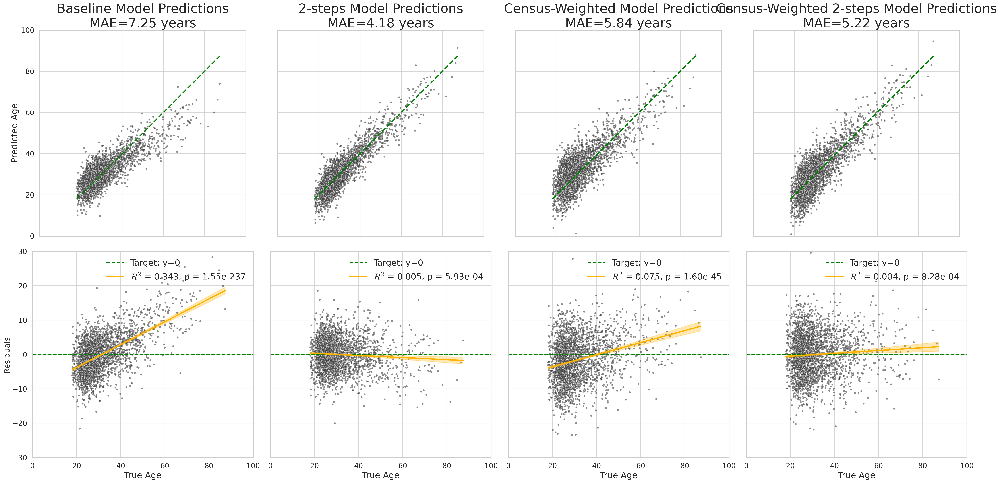

In [155]:
# plot actual vs predicted for all of the models
# plot residuals vs age for all of the models
from statsmodels.formula.api import ols
import statsmodels.api as sm

keys_vis = {
    "baseline": "Baseline Model",
    "weighted": "Census-Weighted Model",
    "linear_ph": "2-steps Model",
    "quadratic_ph": "Quadratic Post-hoc",
    "combined": "Census-Weighted 2-steps Model",
}

title_fontsize = 30
rest_fontsize = 20

nmodels = len(weighting_predictions)
fig, axes = plt.subplots(2, nmodels, figsize=(8 * nmodels, 16), sharey=False, sharex=True)
for i, (key, df) in enumerate(weighting_predictions.items()):
    ax = axes[0, i]
    sns.scatterplot(data=df, x="True", y="Predicted", ax=ax, s=20, color=COL_REF, alpha=0.6)
    ax.set_title(
        f"{keys_vis[key]} Predictions\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years",
        fontsize=title_fontsize,
    )
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.plot(
        [df["True"].min(), df["True"].max()],
        [df["True"].min(), df["True"].max()],
        color="green",
        linestyle="--",
        lw=3,
    )
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 100)
    if i == 0:
        ax.set_ylabel("Predicted Age", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])


for i, (key, df) in enumerate(weighting_predictions.items()):
    ax = axes[1, i]
    if "ph" in key:
        y_col = "corrected_residuals"
    else:
        df["raw_residuals"] = df["True"] - df["Predicted"]
        y_col = "raw_residuals"
    df = df.rename(columns={"True": "age_at_scan"})
    sns.scatterplot(data=df, x="age_at_scan", y=y_col, ax=ax, s=20, color=COL_REF, alpha=0.6)

    # estimate linear and quadratic fit between residuals and age
    lin_m = ols(f"{y_col} ~ age_at_scan", data=df).fit()
    poly_m = ols(f"{y_col} ~ age_at_scan + I(age_at_scan ** 2)", data=df).fit()
    r, p = pearsonr(df["age_at_scan"], df[y_col])
    p_vis = f"{p:.2e}" if p < 0.001 else f"{p:.3f}"
    # draw the "target": y = 0 line
    ax.axhline(0, color="green", linestyle="--", label="Target: y=0")
    # plot the linear fit
    x_vals = np.linspace(df["age_at_scan"].min(), df["age_at_scan"].max(), 300)
    x_frame = pd.DataFrame({"age_at_scan": x_vals})
    # find the p-value for the linear fit
    p_value = lin_m.f_pvalue
    # For visualisation, find the p < {something} value
    # p_vis = f"{p_value:.2e}" if p_value < 0.001 else f"{p_value:.3f}"
    # lin_label = f"Linear - R² = {lin_m.rsquared_adj:.3f}, p = {p_vis}"
    lin_label = f"$R^2$ = {r**2:.3f}, p = {p_vis}"
    # get predictions with CI
    lin_predictions = lin_m.get_prediction(x_frame)
    lin_predictions = lin_predictions.summary_frame(alpha=0.05)
    # plot the linear fit with confidence intervals
    ax.plot(x_vals, lin_m.predict(x_frame), color=COL_RAW, label=lin_label, lw=3)
    ax.fill_between(
        x_vals,
        lin_predictions["mean_ci_lower"],
        lin_predictions["mean_ci_upper"],
        color=COL_RAW,
        alpha=0.3,
    )
    # plot the quadratic fit
    # poly_label = f"Quadratic - R² = {poly_m.rsquared:.2f}, AIC = {poly_m.aic:.1f}"
    # get predictions with CI
    # poly_predictions = poly_m.get_prediction(x_frame)
    # poly_predictions = poly_predictions.summary_frame(alpha=0.05)
    # plot the quadratic fit with confidence intervals
    # ax.plot(
    #     x_vals, poly_m.predict(x_frame), color=COL_WEIGHTED, label=poly_label, lw=3
    # )
    # ax.fill_between(
    #     x_vals,
    #     poly_predictions["mean_ci_lower"],
    #     poly_predictions["mean_ci_upper"],
    #     color=COL_WEIGHTED, alpha=0.3
    # )
    # ax.set_title(f"{keys_vis[key]} Residuals\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years")
    ax.legend(frameon=False, loc="upper right", fontsize=rest_fontsize)

    ax.set_xlabel("True Age", fontsize=rest_fontsize)
    if i == 0:
        ax.set_ylabel("Residuals")
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])
    ax.set_ylim(-30, 30)

    # ax.set_xlim(df["age_at_scan"].min(), df["age_at_scan"].max())
    # ax.legend(frameon=False)
plt.tight_layout()
savefig_nice(
    fig,
    OUTPUT_DIR / f"fig3_weighted_predictions_{metric}.png",
    tight=True,
    dpi=300,
)
# savefig_nice(
#     fig,
#     OUTPUT_DIR / "global_efficiency.png",
#     tight=True,
#     dpi=300,
# )

In [192]:
vis_predictions = {k: v for k, v in weighting_predictions.items() if k in ["baseline", "linear_ph"]}
val_metric = "MAE"
# weighting_predictions.keys()

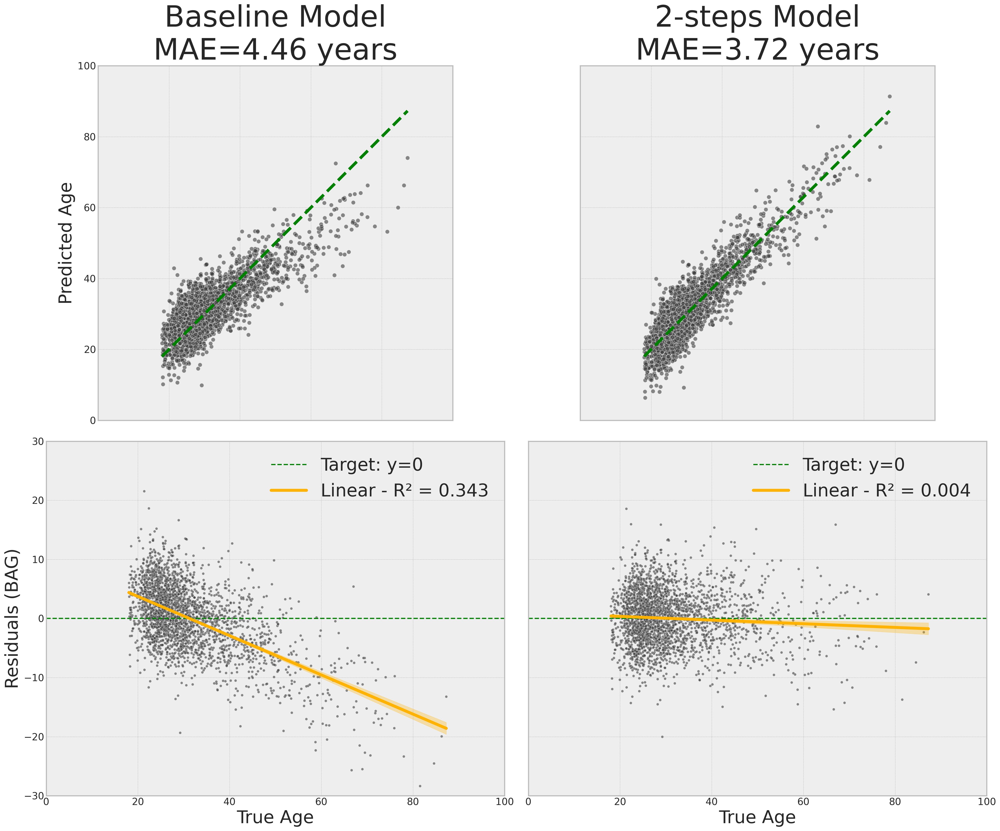

In [193]:
# plot actual vs predicted for all of the models
# plot residuals vs age for all of the models
from statsmodels.formula.api import ols
import statsmodels.api as sm

keys_vis = {
    "baseline": "Baseline Model",
    "weighted": "Census-Weighted Model",
    "linear_ph": "2-steps Model",
    "quadratic_ph": "Quadratic Post-hoc",
    "combined": "Census-Weighted 2-steps Model",
}

title_fontsize = 50
rest_fontsize = 30

nmodels = len(vis_predictions)
fig, axes = plt.subplots(2, nmodels, figsize=(12 * nmodels, 20), sharey=False, sharex=True)
for i, (key, df) in enumerate(vis_predictions.items()):
    ax = axes[0, i]
    sns.scatterplot(data=df, x="True", y="Predicted", ax=ax, s=50, color=COL_REF, alpha=0.6)
    ax.set_title(
        f"{keys_vis[key]}\nMAE={weighting_df.loc[key, val_metric]:.2f} years",
        fontsize=title_fontsize,
    )
    ax.set_aspect("equal")
    ax.set_xlabel("")
    ax.plot(
        [df["True"].min(), df["True"].max()],
        [df["True"].min(), df["True"].max()],
        color="green",
        linestyle="--",
        lw=5,
    )
    ax.set_xlim(0, 100)
    ax.set_ylim(0, 100)
    if i == 0:
        ax.set_ylabel("Predicted Age", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])


for i, (key, df) in enumerate(vis_predictions.items()):
    ax = axes[1, i]
    if "ph" in key:
        y_col = "corrected_residuals"
    else:
        df["raw_residuals"] = df["Predicted"] - df["True"]
        y_col = "raw_residuals"
    df = df.rename(columns={"True": "age_at_scan"})
    sns.scatterplot(data=df, x="age_at_scan", y=y_col, ax=ax, s=20, color=COL_REF, alpha=0.6)

    # estimate linear and quadratic fit between residuals and age
    lin_m = ols(f"{y_col} ~ age_at_scan", data=df).fit()
    poly_m = ols(f"{y_col} ~ age_at_scan + I(age_at_scan ** 2)", data=df).fit()
    # draw the "target": y = 0 line
    ax.axhline(0, color="green", linestyle="--", label="Target: y=0")
    # plot the linear fit
    x_vals = np.linspace(df["age_at_scan"].min(), df["age_at_scan"].max(), 300)
    x_frame = pd.DataFrame({"age_at_scan": x_vals})
    # find the p-value for the linear fit
    p_value = lin_m.f_pvalue
    # For visualisation, find the p < {something} value
    p_vis = f"{p_value:.2e}" if p_value < 0.001 else f"{p_value:.3f}"
    r, p = pearsonr(df["age_at_scan"], df[y_col])
    # lin_label = f"Linear - R² = {lin_m.rsquared_adj:.3f}, p = {p_vis}"
    lin_label = f"Linear - R² = {lin_m.rsquared_adj:.3f}"
    # lin_label = f"$r$ = {r**2:.3f}, p = {p_vis}"
    # get predictions with CI
    lin_predictions = lin_m.get_prediction(x_frame)
    lin_predictions = lin_predictions.summary_frame(alpha=0.05)
    # plot the linear fit with confidence intervals
    ax.plot(x_vals, lin_m.predict(x_frame), color=COL_RAW, label=lin_label, lw=5)
    ax.fill_between(
        x_vals,
        lin_predictions["mean_ci_lower"],
        lin_predictions["mean_ci_upper"],
        color=COL_RAW,
        alpha=0.3,
    )
    # plot the quadratic fit
    # poly_label = f"Quadratic - R² = {poly_m.rsquared:.2f}, AIC = {poly_m.aic:.1f}"
    # get predictions with CI
    # poly_predictions = poly_m.get_prediction(x_frame)
    # poly_predictions = poly_predictions.summary_frame(alpha=0.05)
    # plot the quadratic fit with confidence intervals
    # ax.plot(
    #     x_vals, poly_m.predict(x_frame), color=COL_WEIGHTED, label=poly_label, lw=3
    # )
    # ax.fill_between(
    #     x_vals,
    #     poly_predictions["mean_ci_lower"],
    #     poly_predictions["mean_ci_upper"],
    #     color=COL_WEIGHTED, alpha=0.3
    # )
    # ax.set_title(f"{keys_vis[key]} Residuals\nMAE={weighting_df.loc[key, 'MAE_weighted']:.2f} years")
    ax.legend(frameon=False, loc="upper right", fontsize=rest_fontsize)

    ax.set_xlabel("True Age", fontsize=rest_fontsize)
    if i == 0:
        ax.set_ylabel("Residuals (BAG)", fontsize=rest_fontsize)
    else:
        ax.set_ylabel("")
        # remove y-axis tick labels
        ax.set_yticklabels([])
    ax.set_ylim(-30, 30)

    # ax.set_xlim(df["age_at_scan"].min(), df["age_at_scan"].max())
    # ax.legend(frameon=False)
plt.tight_layout()
savefig_nice(
    fig,
    OUTPUT_DIR / f"fig3_weighted_predictions_{metric}.png",
    tight=True,
    dpi=300,
)
# savefig_nice(
#     fig,
#     OUTPUT_DIR / "global_efficiency.png",
#     tight=True,
#     dpi=300,
# )

In [158]:
import numpy as np, pandas as pd
from sklearn.linear_model import RidgeCV, ElasticNetCV
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.metrics import r2_score, mean_absolute_error, root_mean_squared_error
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

alphas = np.logspace(-3, 4, 30)  # ridge λ grid

outer_cv = KFold(
    n_splits=5,
    shuffle=True,
    random_state=1,
)

perf_rows = []

use_weights = False
# do_post_hoc_correction = True
post_hoc_degree = 1
apply_correction = True

predictions = {}

for metric, X in X_dict.items():
    # Optionally concatenate covariates
    covariates = cov_names[metric]
    if cov_names:
        X_model = np.hstack([X, cov[covariates].to_numpy()])
    else:
        X_model = X
    # y_pred = stratified_regression_cv(X_model, y, w, n_splits=10, n_bins=10)
    grid.fit(
        X_model, y, estimator__sample_weight=w if use_weights else None
    )
    model = grid.best_estimator_
    # y_pred = model.predict(X_model, **{"y_chron": y} if apply_correction else {})
    y_pred = corrected_cross_val_predict(
        estimator=model,
        X=X_model,
        y=y,
        cv=outer_cv,
        params={"estimator__sample_weight": w if use_weights else None},
        correction_func=beheshti_correction if apply_correction else None,
    )
    # y_pred = manual_cross_val_predict(
    #     model=model,
    #     X=X_model,
    #     y=y,
    #     cv=outer_cv,
    #     sample_weight=w if use_weights else None,
    #     apply_correction=apply_correction,
    # )
    residuals = y_pred - y
    predictions_df = cov.copy()
    predictions_df["True"] = y
    predictions_df["Predicted"] = y_pred
    # predictions_df["raw_residuals"] = original_residuals
    predictions_df["corrected_residuals"] = residuals
    predictions[metric] = predictions_df
    perf_rows.append(
        dict(
            metric=metric,
            # R2=r2_score(y, y_pred, sample_weight=w if use_weights else None),
            # MAE=mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None),
            # RMSE=root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None),
            R2=r2_score(y, y_pred),
            R2_weighted=r2_score(y, y_pred, sample_weight=w),
            MAE=mean_absolute_error(y, y_pred),
            MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
            RMSE=root_mean_squared_error(y, y_pred),
            RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
        )
    )
    # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
    #     model=model,
    #     X=X_model,
    #     y_chronological=y,
    #     w=w,
    #     cv=outer_cv,
    #     use_weights=use_weights,
    #     post_hoc_degree=post_hoc_degree,
    #     # residual_orthog_degree=post_hoc_degree,
    # )

    # y_pred = cross_val_predict(
    #     model,
    #     X_model,
    #     y,
    #     # groups=age_strata(y),
    #     cv=outer_cv,
    #     params={"estimator__sample_weight": w if use_weights else None},
    #     n_jobs=-1,
    # )
    # if do_post_hoc_correction:
    #     resid = y - y_pred
    #     z = np.polyfit(y, resid, 2)
    #     p = np.poly1d(z)
    #     y_pred = y_pred + p(y)
    # # Save predictions

    # break

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits


3.962483412485488
0.7421704060614165


(0.0, 100.0)

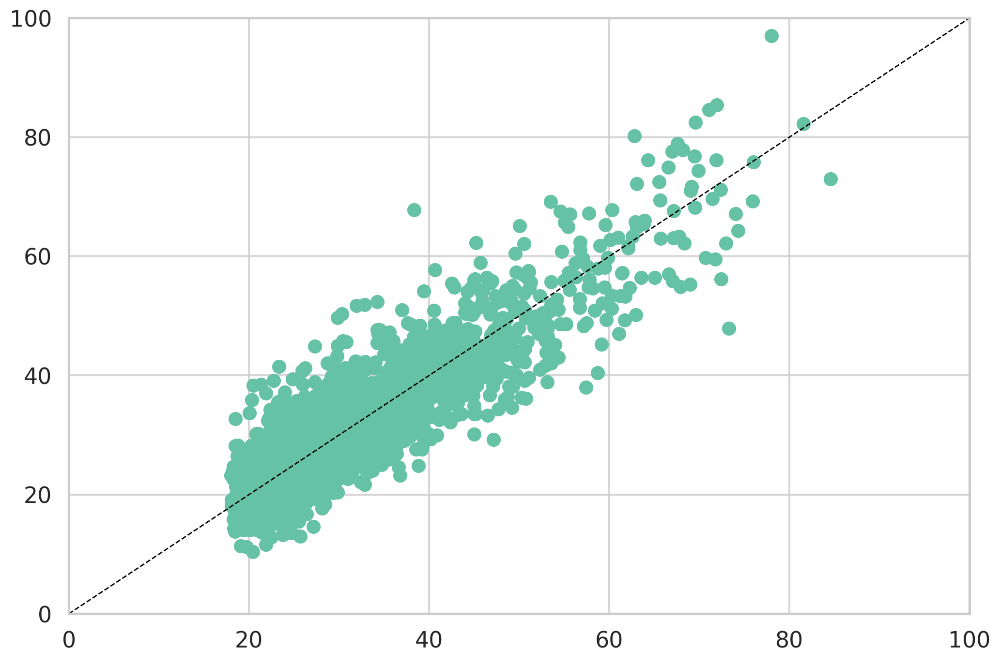

In [159]:
print(mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None))
print(r2_score(y, y_pred, sample_weight=w if use_weights else None))
plt.scatter(y, y_pred)
plt.plot([0, 100], [0, 100], color="black", linestyle="--", linewidth=1)
plt.xlim(0, 100)
plt.ylim(0, 100)

In [160]:
from scipy.stats import spearmanr

spearmanr(predictions["gm_vol"]["True"], predictions["gm_vol"]["corrected_residuals"])

SignificanceResult(statistic=np.float64(-0.03724705106309069), pvalue=np.float64(0.058439187714952365))

In [161]:
pd.DataFrame(perf_rows).set_index("metric").sort_values("MAE_weighted", ascending=True)

,R2,R2_weighted,MAE,MAE_weighted,RMSE,RMSE_weighted
metric,,,,,,
gm_vol,0.785585,0.919225,3.732867,4.213327,4.713008,5.309247
wm_vol,0.753941,0.912524,4.022235,4.418178,5.048825,5.525108
fa,0.781632,0.870827,3.623510,4.780208,4.756258,6.714006
ad,0.768240,0.884814,3.718550,4.821435,4.899930,6.340074
csf_vol,0.750258,0.873604,3.904616,5.069173,5.086471,6.641447
rd,0.742170,0.861532,3.962483,5.239187,5.168171,6.951357
adc,0.734820,0.848721,3.983788,5.517769,5.241327,7.265824


In [162]:
# ### ----------- Concatenate all metrics into one model ----------- ###
# from sklearn.pipeline import make_pipeline

# X_concat = np.hstack([X_dict[m] for m in metrics])  # already row-aligned
# # add covariates
# covariates = pd.concat([cov[cov_names[m]] for m in metrics], axis=1)
# # drop duplicate columns
# covariates = covariates.loc[:, ~covariates.columns.duplicated()].to_numpy()
# X_concat = np.hstack([X_concat, covariates])

# pipe = Pipeline(
#     [
#         ("scaler", scaler),
#         ("estimator", estimator),
#     ]
# )
# y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
#     model=pipe,
#     X=X_concat,
#     y_chronological=y,
#     w=w,
#     cv=outer_cv,
#     use_weights=use_weights,
#     post_hoc_degree=post_hoc_degree,
#     # residual_orthog_degree=post_hoc_degree,
# )

# # if do_post_hoc_correction:
# #     resid = y - y_pred
# #     z = np.polyfit(y, resid, 2)
# #     p = np.poly1d(z)
# #     y_pred = y_pred + p(y)
# # # Save predictions
# predictions_df = cov.copy()
# predictions_df["True"] = y
# predictions_df["Predicted"] = y_pred
# predictions_df["raw_residuals"] = original_residuals
# predictions_df["corrected_residuals"] = corrected_residuals
# predictions["concatenated"] = predictions_df
# perf_rows.append(
#     dict(
#         metric="concatenated",
#         R2=r2_score(y, y_pred),
#         R2_weighted=r2_score(y, y_pred, sample_weight=w),
#         MAE=mean_absolute_error(y, y_pred),
#         MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
#         RMSE=root_mean_squared_error(y, y_pred),
#         RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
#     )
# )

In [163]:
# polynomial features
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor

# ---------------------------------------------------------------------
# 2. Parcel-wise base-learner loop
# ---------------------------------------------------------------------
stacked_models = parcels.copy()

stacked_estimators = {}
predictions["base_stacked"] = {}

alphas = np.logspace(-3, 4, 30)  # ridge grid
for i, row in parcels.iterrows():  # i == parcel index (0..453)
    # ------------- build design matrix for parcel i -----------------
    # X_roi : (n_subjects , 5 metrics)
    # X_cov = cov[cov_names["gm_vol"]].to_numpy()
    X_roi = np.hstack([X_dict[m][:, [i]] for m in metrics])
    # X_roi = np.hstack([X_roi, X_cov])  # add covariates
    grid.fit(
        X_roi, y, estimator__sample_weight=w if use_weights else None
    )  # fit the model
    model = grid.best_estimator_  # get the best model
    y_pred = cross_val_predict(
        estimator=model,
        X=X_roi,
        y=y,
        cv=outer_cv,
        params={"estimator__sample_weight": w if use_weights else None},
        # correction_func=beheshti_correction if apply_correction else None,
    )
    # y_pred = manual_cross_val_predict(
    #     model=pipe,
    #     X=X_roi,
    #     y=y,
    #     cv=outer_cv,
    #     sample_weight=w if use_weights else None,
    #     # apply_correction=apply_correction,
    #     apply_correction=False,
    # )
    # y_pred = pipe.predict(X_roi, **{"y_chron": y} if apply_correction else {})
    residuals = y_pred -y
    # ---------------- fit model & predict --------------------------
    # y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
    #     model=pipe,
    #     X=X_roi,
    #     y_chronological=y,
    #     w=w,
    #     cv=outer_cv,
    #     use_weights=use_weights,
    #     post_hoc_degree=0,
    #     # residual_orthog_degree=post_hoc_degree,
    # )

    # ---------------- store predictions & metrics -------------------
    pred_df = cov.copy()
    pred_df["True"] = y
    pred_df["Predicted"] = y_pred
    # pred_df["raw_residuals"] = original_residuals
    pred_df["corrected_residuals"] = residuals
    predictions["base_stacked"][i] = pred_df
    r2 = r2_score(y, y_pred)
    mae = mean_absolute_error(y, y_pred)
    rmse = root_mean_squared_error(y, y_pred)
    r2_weighted = r2_score(y, y_pred, sample_weight=w)
    mae_weighted = mean_absolute_error(y, y_pred, sample_weight=w)
    rmse_weighted = root_mean_squared_error(y, y_pred, sample_weight=w)

    stacked_models.loc[
        i, ["R2", "MAE", "RMSE", "R2_weighted", "MAE_weighted", "RMSE_weighted"]
    ] = [r2, mae, rmse, r2_weighted, mae_weighted, rmse_weighted]
    stacked_estimators[i] = model
    # if i == 428:
    #     break

Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 5 folds for each of 30 candidates, totalling 150 fits
Fitting 

<Axes: >

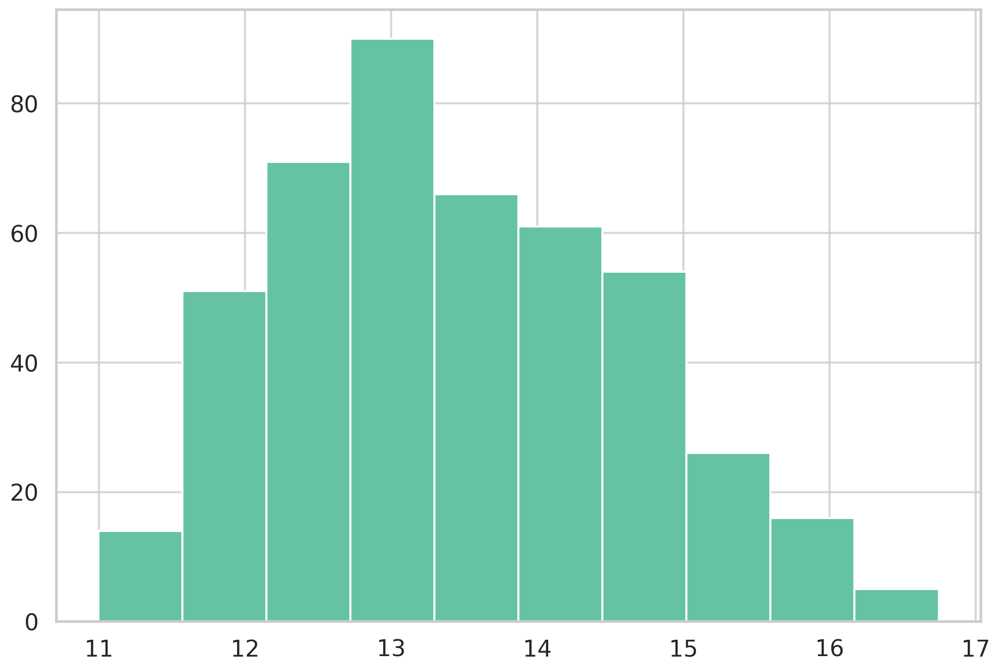

In [164]:
stacked_models["MAE_weighted"].hist()
# plt.scatter(y,y_pred)
# stacked_models.sort_values("MAE_weighted", ascending=True)

In [165]:
stacked_models.sort_values("MAE_weighted", ascending=True)

,index,name,base_name,Label Name,network,component,hemisphere,R2,MAE,RMSE,R2_weighted,MAE_weighted,RMSE_weighted
247,248,7Networks_RH_SomMot_18,7networks_rh_sommot,7Networks_RH_SomMot,somatomotor,somatomotor,R,0.376464,6.081357,8.037132,0.445061,10.993875,13.916119
251,252,7Networks_RH_SomMot_22,7networks_rh_sommot,7Networks_RH_SomMot,somatomotor,somatomotor,R,0.385470,6.068152,7.978879,0.438130,11.012231,14.002751
359,360,7Networks_RH_Cont_PFCmp_1,7networks_rh_cont_pfcmp,7Networks_RH_Cont_PFCmp,control,medial posterior prefrontal cortex,R,0.398442,5.985908,7.894222,0.403293,11.124967,14.430316
49,50,7Networks_LH_SomMot_19,7networks_lh_sommot,7Networks_LH_SomMot,somatomotor,somatomotor,L,0.388328,6.111437,7.960304,0.429644,11.126900,14.108096
153,154,7Networks_LH_Default_Temp_6,7networks_lh_default_temp,7Networks_LH_Default_Temp,default,temporal,L,0.386319,6.021437,7.973367,0.413527,11.139439,14.306035
...,...,...,...,...,...,...,...,...,...,...,...,...,...
401,402,HIP-head-m2-rh,HIP-head-m2,"Hippocampus head, medial division",subcortex,Hippocampus head,R,0.063284,7.375099,9.850869,-0.207225,16.215922,20.525300
330,331,7Networks_RH_Limbic_TempPole_7,7networks_rh_limbic_temppole,7Networks_RH_Limbic_TempPole,limbic,temporal pole,R,0.057381,7.344362,9.881858,-0.275732,16.369587,21.099643
125,126,7Networks_LH_Limbic_TempPole_8,7networks_lh_limbic_temppole,7Networks_LH_Limbic_TempPole,limbic,temporal pole,L,0.052134,7.358039,9.909322,-0.288203,16.500599,21.202521
425,426,pGP-rh,pGP,"Pallidum, posterior part",subcortex,Pallidum,R,0.037319,7.441000,9.986465,-0.289001,16.619699,21.209087


In [166]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import RidgeCV
from sklearn.metrics import (
    r2_score,
    mean_absolute_error,
    mean_squared_error,
)

# ------------------------------------------------------------------
# 1.  Build the meta-feature matrix  (n_subj × n_parcels [+ covariates])
# ------------------------------------------------------------------
# stack parcel OOF columns → shape (454, n_subj) → transpose
X_cov = cov[cov_names["gm_vol"]].to_numpy()
X_stacked = np.vstack(
    [predictions["base_stacked"][i]["Predicted"].to_numpy() for i in predictions["base_stacked"]]
).T  # (n_subj, n_parcels)

# Optionally add covariates (e.g., sex, TIV)
X_stacked = np.hstack([X_stacked, X_cov])  # (n_subj, n_parcels + n_covariates)

# ------------------------------------------------------------------
# 2.  Meta-learner pipeline (standardised ridge with CV on λ)
# ------------------------------------------------------------------
grid.fit(
    X_stacked, y, estimator__sample_weight=w if use_weights else None
)  # fit the model
model = grid.best_estimator_  # get the best model

# y_pred = pipe.predict(X_stacked, **{"y_chron": y} if apply_correction else {})
y_pred = corrected_cross_val_predict(
    estimator=model,
    X=X_stacked,
    y=y,
    cv=outer_cv,
    params={"estimator__sample_weight": w if use_weights else None},
    correction_func=beheshti_correction if apply_correction else None,
)
# y_pred = manual_cross_val_predict(
#     model=pipe,
#     X=X_stacked,
#     y=y,
#     cv=outer_cv,
#     sample_weight=w if use_weights else None,
#     apply_correction=apply_correction,
# )
residuals = y_pred - y
# ------------------------------------------------------------------
# 3.  Out-of-fold meta predictions with fold-wise bias correction
# ------------------------------------------------------------------
# y_pred, original_residuals, corrected_residuals = cross_val_predict_with_bias_correction(
#     model=pipe,
#     X=X_stacked,
#     y_chronological=y,
#     w=w,
#     cv=outer_cv,
#     use_weights=use_weights,
#     post_hoc_degree=post_hoc_degree,
#     # residual_orthog_degree=post_hoc_degree,
# )

# ------------------------------------------------------------------
# 4.  Store predictions and performance
# ------------------------------------------------------------------
pred_df = cov.copy()
pred_df["True"] = y
pred_df["Predicted"] = y_pred
# pred_df["raw_residuals"] = original_residuals
pred_df["corrected_residuals"] = residuals
predictions["stacked"] = pred_df


perf_rows.append(
    dict(
        metric="stacked",
        R2=r2_score(y, y_pred),
        R2_weighted=r2_score(y, y_pred, sample_weight=w),
        MAE=mean_absolute_error(y, y_pred),
        MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
        RMSE=root_mean_squared_error(y, y_pred),
        RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
    )
)

Fitting 5 folds for each of 30 candidates, totalling 150 fits


In [167]:
dict(
    metric="stacked",
    R2=r2_score(y, y_pred),
    R2_weighted=r2_score(y, y_pred, sample_weight=w),
    MAE=mean_absolute_error(y, y_pred),
    MAE_weighted=mean_absolute_error(y, y_pred, sample_weight=w),
    RMSE=root_mean_squared_error(y, y_pred),
    RMSE_weighted=root_mean_squared_error(y, y_pred, sample_weight=w),
)

{'metric': 'stacked',
 'R2': 0.8035464970574703,
 'R2_weighted': 0.9071198278491387,
 'MAE': 3.501924285617011,
 'MAE_weighted': 4.398544892269035,
 'RMSE': 4.51128632406462,
 'RMSE_weighted': 5.693205378929773}

In [186]:
m = "MAE"
perf_df = pd.DataFrame(perf_rows).set_index("metric").sort_values(m, ascending=True)

In [187]:
perf_df["is_best"] = perf_df[m] == perf_df[m].min()
# set is_best == False to gray and True to green (use RGB colors)
perf_df["color"] = perf_df["is_best"].map({True: "green", False: "gray"})

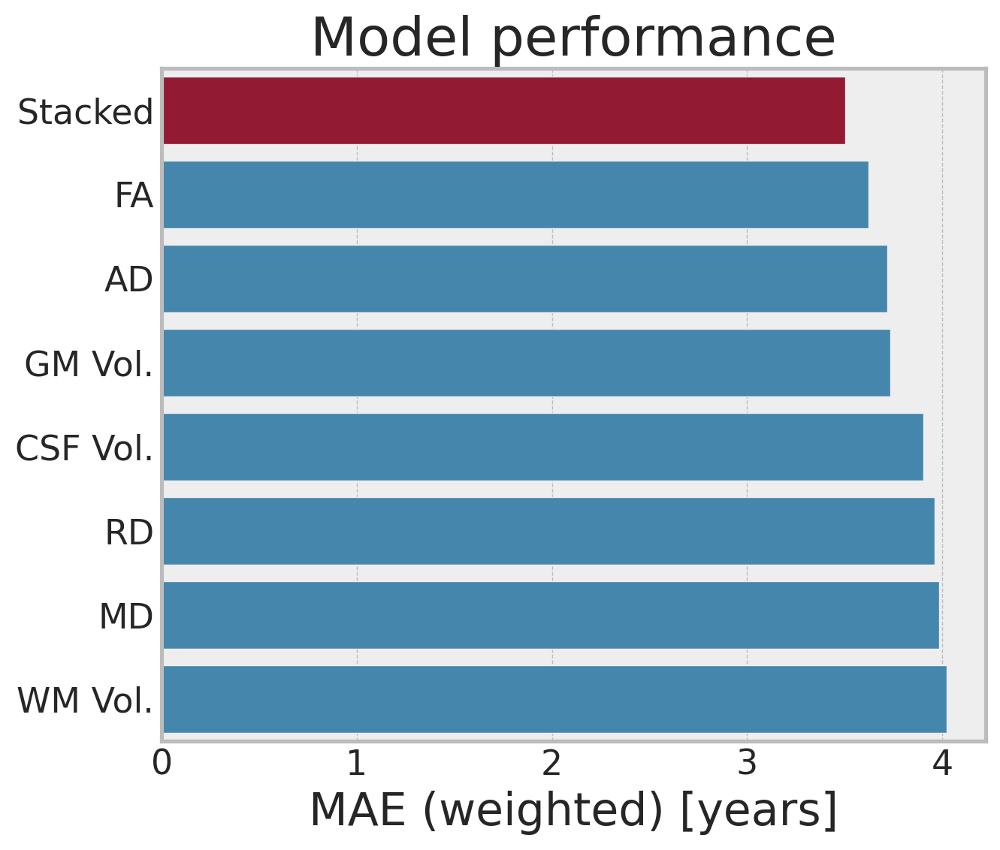

In [189]:
# -----------------------------------------------------------
# 2.  barplot with 95 % BCa bootstrap CIs on R²
# -----------------------------------------------------------
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.utils import resample

ticks_mapping = {
    "gm_vol": "GM Vol.",
    "wm_vol": "WM Vol.",
    "csf_vol": "CSF Vol.",
    "rd": "RD",
    "fa": "FA",
    "ad": "AD",
    "adc": "MD",
    "stacked": "Stacked",
}

fig, ax = plt.subplots(figsize=(7, 6))
sns.barplot(
    y="metric", x=m, data=perf_df.reset_index(), ax=ax, orient="h", hue="is_best", legend=False
)
# ax.errorbar(
#     x=np.arange(len(perf_df)),
#     y=perf_df["RMSE"],
#     # yerr=[perf_df["R2"] - ci_lo, ci_hi - perf_df["R2"]],
#     fmt="none",

#     capsize=4,
#     color="k",
#     lw=1,
# )
# change the y-ticks to the metric names
ax.set_yticks(np.arange(len(perf_df)))
ax.set_yticklabels([ticks_mapping.get(m, m) for m in perf_df.index])
# ax.set_ylabel("$R^{2}$  (10× CV, bias-corrected)")
ax.set_xlabel("MAE (weighted) [years]")
ax.set_ylabel("")
ax.set_title("Model performance")
# ax.set_xticks(np.arange(0, 1.1, 0.1))
# ax.set_ylim(0.8, perf_df["R2"].max() * 1.15)
plt.tight_layout()
# ax.set_xlim(3,6)
savefig_nice(
    fig,
    OUTPUT_DIR / "model_performance.png",
    tight=True,
    dpi=300,
)
# plt.show()

In [190]:
OUTPUT_DIR

PosixPath('/home/groot/Projects/neuroaging/figures/fig4')

In [171]:
best_metric = perf_df.index[0]
# best_metric = "stacked"
y = predictions[best_metric]["True"].to_numpy()
y_pred = predictions[best_metric]["Predicted"].to_numpy()
# w = predictions[best_metric]["weight"].to_numpy()
df_vis = (
    predictions[best_metric][["True", "Predicted"]]
    .copy()
    .rename(columns={"True": "age", "Predicted": "predicted"})
)

df_vis["residuals"] = df_vis["predicted"] - df_vis["age"]
# # build a model to predict the residuals
# import statsmodels.api as sm
# from statsmodels.formula.api import ols
# import statsmodels.formula.api as smf

# # Fit a linear model to the residuals
# df["residuals"] = residuals
# model = ols("residuals ~ age", data=df).fit()
# # use the model to "fix" the predictions
# df["fixed_predicted"] = df["predicted"] + model.resid

/tmp/ipykernel_42050/3178380517.py:23: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/tmp/ipykernel_42050/3178380517.py:56: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


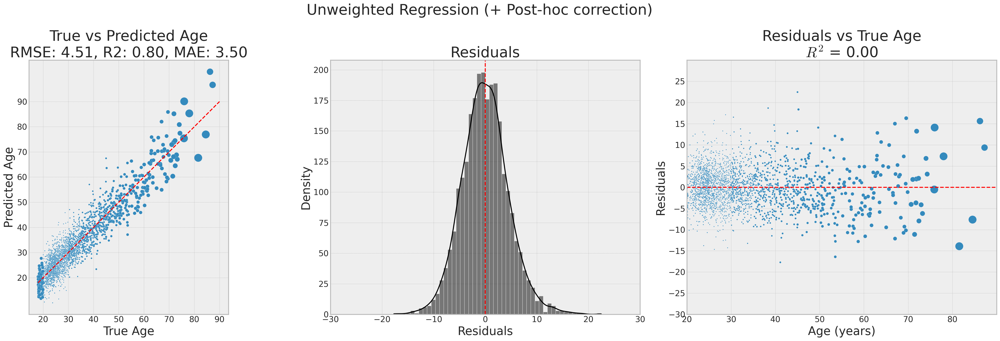

In [172]:
import seaborn as sns
from scipy.stats import pearsonr, spearmanr

plt.style.use("bmh")

do_post_hoc_correction = True
use_weights = False

r2 = r2_score(y, y_pred, sample_weight=w if use_weights else None)
rmse = root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None)
mae = mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None)

# r2 = r2_score(y, y_pred)
# rmse = root_mean_squared_error(y, y_pred)
# mae = mean_absolute_error(y, y_pred)


title = f"True vs Predicted Age\nRMSE: {rmse:.2f}, R2: {r2:.2f}, MAE: {mae:.2f}"

fig, axes = plt.subplots(1, 3, figsize=(30, 10))
# plot true vs predicted
ax = axes[0]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="predicted",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.plot([18, 90], [18, 90], "--", c="red")
ax.set_xlabel("True Age", fontsize=24)
ax.set_ylabel("Predicted Age", fontsize=24)
ax.set_title(title, fontsize=30)
ax.set_xticks(range(20, 100, 10))
ax.set_yticks(range(20, 100, 10))
# make axis square
ax.set_aspect("equal", "box")

# plot residuals
ax = axes[1]
sns.histplot(data=df_vis, x="residuals", ax=ax, kde=True, color="black")
ax.set_xlabel("Residuals", fontsize=24)
ax.set_ylabel("Density", fontsize=24)
ax.set_title("Residuals", fontsize=30)
ax.axvline(0, color="red", linestyle="--")
ax.set_xlim(-30, 30)
# plot residuals vs true age

r, p = pearsonr(df_vis["age"], df_vis["residuals"])

ax = axes[2]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="residuals",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.axhline(0, color="red", linestyle="--")
ax.set_xlabel("Age (years)", fontsize=24)
ax.set_ylabel("Residuals", fontsize=24)
ax.set_title("Residuals vs True Age\n$R^2$ = {:.2f}".format(r**2), fontsize=30)
ax.set_xticks(range(20, 90, 10))
ax.set_yticks(range(-30, 30, 5))
ax.set_xlim(20, 90)
ax.set_ylim(-30, 30)
# make axis square

suptitle = "Weighted Regression" if use_weights else "Unweighted Regression"
if do_post_hoc_correction:
    suptitle += " (+ Post-hoc correction)"
fig.suptitle(suptitle, fontsize=30)

plt.tight_layout()

/tmp/ipykernel_42050/4031689567.py:24: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(
/tmp/ipykernel_42050/4031689567.py:57: UserWarning: Ignoring `palette` because no `hue` variable has been assigned.
  sns.scatterplot(


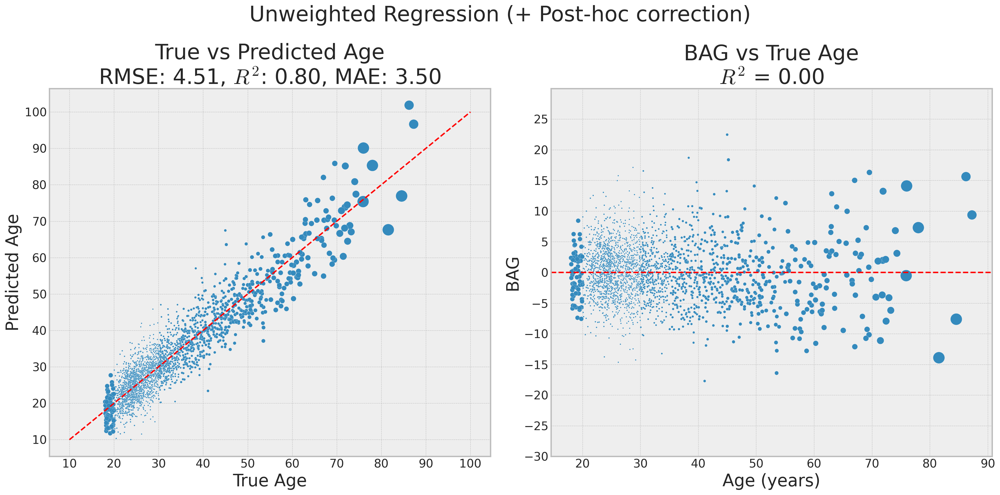

In [173]:
import seaborn as sns
from scipy.stats import pearsonr, spearmanr

plt.style.use("bmh")

do_post_hoc_correction = True
use_weights = False

r2 = r2_score(y, y_pred, sample_weight=w if use_weights else None)
rmse = root_mean_squared_error(y, y_pred, sample_weight=w if use_weights else None)
mae = mean_absolute_error(y, y_pred, sample_weight=w if use_weights else None)

# r2 = r2_score(y, y_pred)
# rmse = root_mean_squared_error(y, y_pred)
# mae = mean_absolute_error(y, y_pred)


# title = f"True vs Predicted Age\nRMSE: {rmse:.2f}, R2: {r2:.2f}, MAE: {mae:.2f}"
title = f"True vs Predicted Age\nRMSE: {rmse:.2f}, $R^2$: {r2:.2f}, MAE: {mae:.2f}"

fig, axes = plt.subplots(1, 2, figsize=(20, 10))
# plot true vs predicted
ax = axes[0]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="predicted",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.plot([10, 100], [10, 100], "--", c="red")
ax.set_xlabel("True Age", fontsize=24)
ax.set_ylabel("Predicted Age", fontsize=24)
ax.set_title(title, fontsize=30)
ax.set_xticks(range(10, 110, 10))
ax.set_yticks(range(10, 110, 10))
# make axis square
# ax.set_aspect("equal", "box")

# plot residuals
# ax = axes[1]
# sns.histplot(data=df, x="residuals", ax=ax, kde=True, color="black")
# ax.set_xlabel("Residuals", fontsize=24)
# ax.set_ylabel("Density", fontsize=24)
# ax.set_title("Residuals", fontsize=30)
# ax.axvline(0, color="red", linestyle="--")

# plot residuals vs true age

r, p = pearsonr(df_vis["age"], df_vis["residuals"])

ax = axes[1]
sns.scatterplot(
    data=df_vis,
    x="age",
    y="residuals",
    ax=ax,
    # cmap="jet",
    # color by weight,
    # hue=w.flatten(),
    palette="viridis",
    s=w * 10,
)
ax.axhline(0, color="red", linestyle="--")
ax.set_xlabel("Age (years)", fontsize=24)
ax.set_ylabel("BAG", fontsize=24)
ax.set_title("BAG vs True Age\n$R^2$ = {:.2f}".format(r**2), fontsize=30)
ax.set_xticks(range(20, 100, 10))
ax.set_yticks(range(-30, 30, 5))
ax.set_ylim(-30, 30)
# make axis square

suptitle = "Weighted Regression" if use_weights else "Unweighted Regression"
if do_post_hoc_correction:
    suptitle += " (+ Post-hoc correction)"
fig.suptitle(suptitle, fontsize=30)

plt.tight_layout()
savefig_nice(
    fig,
    OUTPUT_DIR / "true_vs_predicted_age.png",
    tight=True,
    dpi=300,
)

In [195]:
predictions_df = pd.DataFrame()
for metric in predictions:
    if "base_stacked" in metric:
        for i, row in parcels.iterrows():
            cur_df = predictions[metric][i][["True", "Predicted"]].copy()
            cur_df = cur_df.rename(
                columns={"True": f"base_{i}_age", "Predicted": f"base_{i}_predicted"}
            )
            cur_df[f"base_{i}_BAG"] = cur_df[f"base_{i}_predicted"] - cur_df[f"base_{i}_age"]
            predictions_df = pd.concat([predictions_df, cur_df], axis=1)
        continue
    cur_df = (
        predictions[metric][["True", "Predicted"]]
        .copy()
        .rename(columns={"True": f"{metric}_age", "Predicted": f"{metric}_predicted"})
    )
    cur_df[f"{metric}_BAG"] = cur_df[f"{metric}_predicted"] - cur_df[f"{metric}_age"]
    predictions_df = pd.concat([predictions_df, cur_df], axis=1)


# w = predictions[best_metric]["weight"].to_numpy()


# # build a model to predict the residuals
# import statsmodels.api as sm
# from statsmodels.formula.api import ols
# import statsmodels.formula.api as smf

# # Fit a linear model to the residuals
# df["residuals"] = residuals
# model = ols("residuals ~ age", data=df).fit()
# # use the model to "fix" the predictions
# df["fixed_predicted"] = df["predicted"] + model.resi

In [196]:
predictions_df.to_csv("BAG_data.csv")

In [176]:
# df_cov = pd.read_csv("~/Projects/plasticityhub/sessions.csv")
df_cov = pd.read_csv("~/Projects/neuroaging/data/external/sessions.csv")
df_cov = df_cov.drop_duplicates(subset=["subject_code"]).set_index("subject_code")
# df_cov = pd.read_pickle(f"/media/storage/phd/papers/aging/{ATLAS}/gm_vol.pkl").reset_index(
#     drop=True
# )
# df_cov = pd.read_csv("~/Projects/plasticityhub/sessions.csv")
# df_cov = pd.read_csv("qV1v.csv")

# finished_subjects = (
#     pd.read_csv("/media/storage/phd/papers/aging/schaefer2018tian2020_400_7/subjects.csv")
#     .values.flatten()
#     .tolist()
# )
# df_cov = df_cov[df_cov["Subject Code"].isin(finished_subjects)]

# df_cov = df_cov.groupby("subject_code").first()
df = df_cov.merge(predictions_df, left_on="subject_code", right_index=True, how="inner")
# merge with cov
# df_cov = df_cov.merge(cov, left_on="subject_code", right_index=True, how="inner")
df["BMI"] = df["weight"] / ((df["height"] / 100) ** 2)


# exercise_frequency_mapping = {
#     "פעמיים-שלוש בשבוע": 2.5,
#     "1-1": 1.5,
#     "יותר מ-3 פעמים בשבוע": 4,
# }
# df_cov["exercise_frequency"] = df_cov["exercise_frequency"].map(
#     exercise_frequency_mapping
# )
df["number_of_children"] = df["number_of_children"].fillna(0)

education_level_mapping = {
    "elementary school": 1,
    "partial high school": 2,
    "high_school": 3,
    "post-secondary": 4,
    "undergraduate": 5,
    "bachelor's degree": 6,
    "U": np.nan,
    # "other": np.nan,
}
df["education_level"] = df["education_level"].map(education_level_mapping)

for col in ["blood_sugar", "blood_pressure", "thyroids", "lipids"]:
    df[col] = (
        df[col]
        .str.lower()
        .map(
            {
                "high": 1,
                "normal": 0,
                "low": -1,
                "very low": -2,
                "very high": 2,
            }
        )
    )

In [177]:
fs_output_template = (
    "/media/storage/yalab-dev/derivatives/freesurfer/sub-{subj}/stats/aseg_stats.csv"
)
for subject in df.index:
    fs_output = fs_output_template.format(subj=subject)
    if not Path(fs_output).exists():
        print(f"File {fs_output} does not exist, skipping subject {subject}")
        continue
    fs_df = pd.read_csv(fs_output, sep="\t")
    for col in fs_df.columns:
        df.loc[
            subject,
            col.lower()
            .replace("-", "_")
            .replace("3rd", "third")
            .replace("4th", "fourth")
            .replace("5th", "fifth"),
        ] = fs_df.loc[0, col]

File /media/storage/yalab-dev/derivatives/freesurfer/sub-BAL02/stats/aseg_stats.csv does not exist, skipping subject BAL02
File /media/storage/yalab-dev/derivatives/freesurfer/sub-B002/stats/aseg_stats.csv does not exist, skipping subject B002
File /media/storage/yalab-dev/derivatives/freesurfer/sub-BAL03/stats/aseg_stats.csv does not exist, skipping subject BAL03
File /media/storage/yalab-dev/derivatives/freesurfer/sub-BAL04/stats/aseg_stats.csv does not exist, skipping subject BAL04
File /media/storage/yalab-dev/derivatives/freesurfer/sub-BAL05/stats/aseg_stats.csv does not exist, skipping subject BAL05
File /media/storage/yalab-dev/derivatives/freesurfer/sub-BAL06/stats/aseg_stats.csv does not exist, skipping subject BAL06
File /media/storage/yalab-dev/derivatives/freesurfer/sub-B004/stats/aseg_stats.csv does not exist, skipping subject B004
File /media/storage/yalab-dev/derivatives/freesurfer/sub-BAL07/stats/aseg_stats.csv does not exist, skipping subject BAL07
File /media/storage/

In [178]:
df.to_csv("BAG_data.csv")

In [179]:
x_cols = [
    "sex",
    "BMI",
    "psqi",
    # "hli",
    # "gad7",
    # "pcl5",
    # "oasis",
    # "swls",
    # "psychometric_score",
    # "weekly_workouts",
    # "alcohol",
    # "sugar_beverages",
    # "water",
    # "caffeine"
    "blood_sugar",
    "blood_pressure",
    "thyroids",
    "lipids",
]

In [180]:
target = "residuals"
# Categories from analysis
categories = {
    "continuous": [
        "age_at_scan",
        "weight",
        "relationship_duration",
        "number_of_children",
        "number_of_siblings",
        "b5_extraversion",
        "b5_agreeableness",
        "b5_conscientiousness",
        "b5_emotional_stability",
        "b5_openness",
        "hli",
        "swls",
        "BMI",
        "salary",
        "years_in_residence",
    ],
    "ordinal": [
        "education_level",
        "sibling_order",
        "psqi",
        "oasis",
        "pcl5",
        "gad7",
        "phq9",
        "blood_sugar",
        "blood_pressure",
        "thyroids",
        "lipids",
    ],
    "categorical": [
        "sex",
        "handedness",
        "gender",
        "sexual_orientation",
        "living_environment",
        "marital_status",
        "ethnic_identity",
        "political_orientation",
        "religion",
        "religion_degree",
        "family_history",
        "severe_health_conditions",
        "major_health_conditions",
        "minor_health_conditions",
        "brain_health",
        "depression",
        "anxiety",
        "communication_disorders",
        "attention_disorders",
        "visual_aid",
        "hearing_aid",
        "long_covid",
    ],
    "other": ["subject_id", "session_id", "path", "version", "years_in_residence", "twins"],
}

# Key measures to prioritize
key_measures = [
    "BMI",
    "psqi",
    "relationship_duration",
    "religion_degree",
    "sexual_orientation",
    "living_environment",
    "marital_status",
    "visual_aid",
]

vars_to_check = [target] + key_measures

In [181]:
from sklearn.cross_decomposition import CCA
from sklearn.preprocessing import StandardScaler

# Target (BAG)
target = "adc_residuals"

# Key behavioral measures for Set 2
key_measures = [
    "BMI",
    # 'relationship_duration',
    "religion_degree",
    "sexual_orientation",
    "living_environment",
    "marital_status",
    "psqi",
    "oasis",
    "pcl5",
    "sex",
    "anxiety",
    "depression",
    "communication_disorders",
    "attention_disorders",
]

# Encode categorical
df_encoded = pd.get_dummies(
    df.replace({"U": np.nan}).dropna(subset=key_measures)[key_measures], drop_first=True
)

PatsyError: Error evaluating factor: NameError: name 'adc_residuals' is not defined
    adc_residuals ~ age_at_scan + C(sex)
    ^^^^^^^^^^^^^

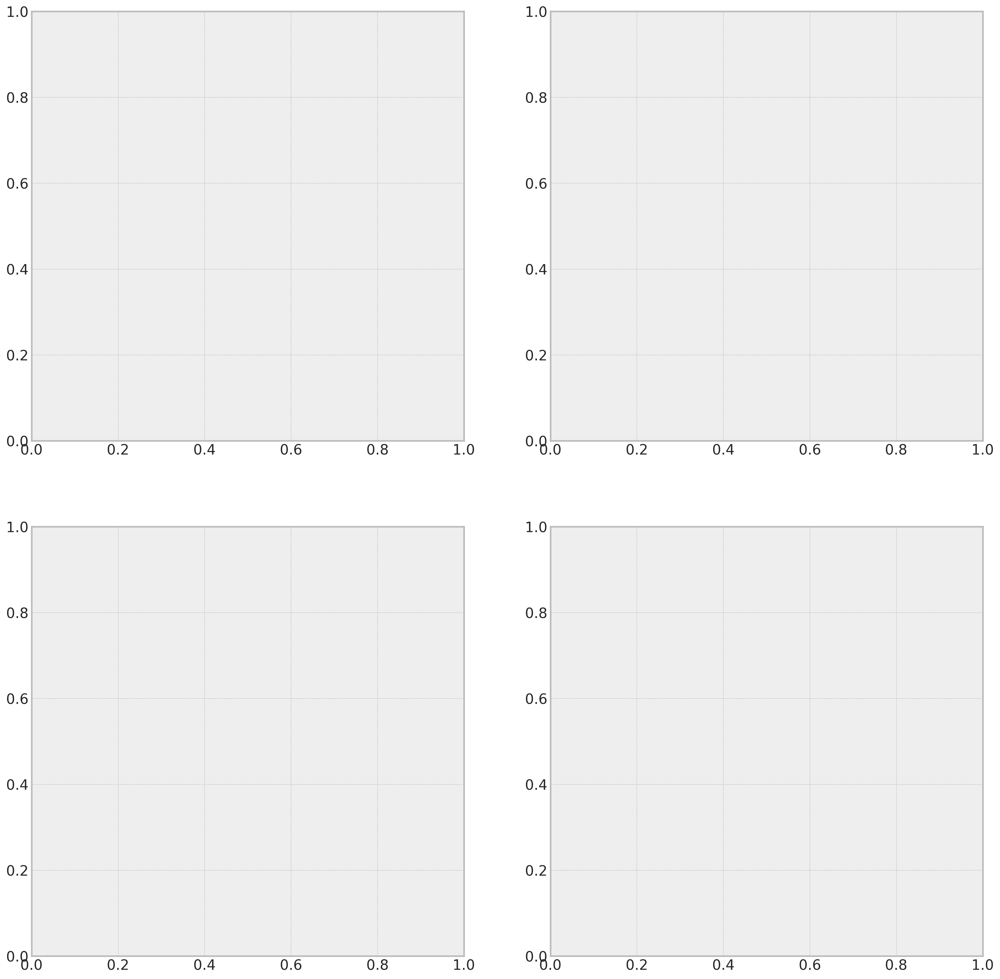

In [182]:
from scipy import stats

fig, axes = plt.subplots(2, 2, figsize=(20, 20))
# first row - boxplot with OLS regression line
for cropped, ax in zip([False, True], axes[0]):
    cur_df = df.copy() if not cropped else df[df["age_at_scan"] > 50]
    res = ols(f"{target} ~ age_at_scan + C(sex)", data=cur_df).fit()

    sns.boxplot(data=cur_df, x="sex", y=target, ax=ax)
    title = f"{target} by Sex"
    if cropped:
        title += " (Cropped)"
    title += f"\n OLS: R²={res.rsquared:.2f}, p={res.f_pvalue:.3f}"
    ax.set_title(title, fontsize=30)

# second row - distribution of target variable
for cropped, ax in zip([False, True], axes[1]):
    cur_df = df.copy() if not cropped else df[df["age_at_scan"] > 50]
    sns.histplot(
        data=cur_df,
        x=target,
        hue="sex",
        ax=ax,
        kde=True,
        # color="black",
        bins=30,
    )
    title = f"Distribution of {target}"
    if cropped:
        title += "\n(Cropped)"
    ax.set_title(title, fontsize=30)
    ax.set_xlabel(target, fontsize=24)
    ax.set_ylabel("Density", fontsize=24)

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.utils import resample


def rolling_window_analysis(
    df, x_col="BMI", target="residuals", group_size=100, step=10, n_bootstraps=1000
):
    """
    Perform rolling window analysis on sorted age data.

    Sorts df by age ascending, then slides overlapping windows of size group_size with step.
    For each window, fits OLS: target ~ age_at_scan + x_col (or C(x_col) if binary).
    Extracts beta/p for x_col (single value for continuous/binary).

    Parameters:
    - df: DataFrame with 'age', 'age_at_scan', target, x_col.
    - x_col: Predictor column (e.g., 'BMI').
    - target: Dependent variable (e.g., 'residuals').
    - group_size: Window size (default 100).
    - step: Step for overlapping windows (default 10; smaller = more overlap).

    Returns:
    - bins_df: DataFrame with per-window stats.
    - model_summary: Summary of beta ~ median_age OLS (if beta is scalar).
    """
    # Filter NaN in x_col and sort by age ascending
    df_test = df[df[x_col].notna()].copy()
    df_test = df_test.sort_values("age", ascending=True).reset_index(drop=True)

    # Initialize results DF
    bins_df = pd.DataFrame(
        columns=["median_age", "group_size", "min_age", "max_age", "residuals_median", "beta", "p"]
    )

    # Rolling windows loop
    for i in range(0, len(df_test) - group_size + 1, step):
        group = df_test.iloc[i : i + group_size]
        age = group["age"].median()

        row_idx = len(bins_df)
        bins_df.loc[row_idx, "median_age"] = age
        bins_df.loc[row_idx, "group_size"] = len(group)
        bins_df.loc[row_idx, "min_age"] = group["age"].min()
        bins_df.loc[row_idx, "max_age"] = group["age"].max()
        bins_df.loc[row_idx, "residuals_median"] = group["residuals"].median()

        # Detect if x_col is binary (exactly 2 unique values)
        unique_vals = group[x_col].nunique()
        is_binary = unique_vals == 2

        if unique_vals > 2:
            # print(f"Warning: x_col '{x_col}' has {unique_vals} > 2 unique values in window {row_idx}; skipping or treat as continuous.")
            is_binary = False  # Treat as continuous

        # Build formula
        if is_binary:
            formula = f"{target} ~ C({x_col})"
        else:
            formula = f"{target} ~ {x_col}"
        # Fit OLS
        betas_boot = []
        p_boot = []
        t_boot = []
        for _ in range(n_bootstraps):  # Bootstrap 100 times
            group_boot = resample(group)
            res_boot = ols(formula, data=group_boot).fit()

            # Extract beta/p (for binary, get the treatment level beta)
            if is_binary:
                # Assume reference is first level; treatment param is C(x_col)[T.level]
                treatment_param = [
                    p for p in res_boot.params.index if p.startswith(f"C({x_col})[T.")
                ]
                res_beta = res_boot.params[treatment_param[0]]
                res_t = res_boot.tvalues[treatment_param[0]]
                res_p = res_boot.pvalues[treatment_param[0]]
            else:
                res_beta = res_boot.params[x_col]
                res_t = res_boot.tvalues[x_col]
                res_p = res_boot.pvalues[x_col]
            betas_boot.append(res_beta)
            p_boot.append(res_p)
            t_boot.append(res_t)
        bins_df.loc[row_idx, "beta_mean"] = np.mean(betas_boot)
        bins_df.loc[row_idx, "beta_median"] = np.median(betas_boot)
        bins_df.loc[row_idx, "beta_std"] = np.std(betas_boot)
        bins_df.loc[row_idx, "p_mean"] = np.mean(p_boot)
        bins_df.loc[row_idx, "p_median"] = np.median(p_boot)
        bins_df.loc[row_idx, "p_std"] = np.std(p_boot)
        bins_df.loc[row_idx, "t_mean"] = np.mean(t_boot)
        bins_df.loc[row_idx, "t_median"] = np.median(t_boot)
        bins_df.loc[row_idx, "t_std"] = np.std(t_boot)

    # Correlation between beta and median_age (only if beta is numeric)
    model = ols("t_mean ~ median_age", data=bins_df.astype(float)).fit()
    return bins_df, model


# Example usage (replace with your df)
# bins_df, model = rolling_window_analysis(df_test, x_col="phq9")
# print(model.summary())

# Example usage (replace with your df)
# bins_df, model = rolling_window_analysis(df_test, x_col="phq9")
# print(model)

# Example usage (replace with your df)

# bins_df

In [ ]:
col = "3rd_ventricle"
model = ols(f"residuals ~ age + {col}", data=df).fit()
print(m.summary())

pred_df = pd.DataFrame({col: np.linspace(df[col].min(), df[col].max(), 100)})
pred_df["age"] = df["age"].mean()  # use mean age for prediction

pr = model.get_prediction(pred_df)
ci = pr.conf_int(alpha=0.05)
pred_df["beta_fit"] = pr.predicted_mean
pred_df["beta_lo"] = ci[:, 0]
pred_df["beta_hi"] = ci[:, 1]

fig, ax = plt.subplots(figsize=(10, 6))
sns.scatterplot(data=df, x=col, y="residuals", ax=ax, alpha=0.5)
sns.lineplot(
    data=pred_df,
    x=col,
    y="beta_fit",
    ax=ax,
    color="red",
    label=f"OLS Fit - $R^2={model.rsquared:.2f}, p={model.f_pvalue:.3e}$",
)
ax.fill_between(
    pred_df[col],
    pred_df["beta_lo"],
    pred_df["beta_hi"],
    color="red",
    alpha=0.2,
    label="95% CI",
)
ax.set_xlabel("Ventricle Volume (mm³)", fontsize=14)
ax.set_ylabel("Residuals", fontsize=14)
ax.set_title(f"OLS Fit: Residuals vs {col} Volume", fontsize=16)
ax.legend()
plt.tight_layout()
plt.show()

SyntaxError: invalid syntax (<unknown>, line 1)

In [ ]:
bins_df, model = rolling_window_analysis(
    df, x_col="left_lateral_ventricle", group_size=50, step=10, n_bootstraps=100
)
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                 t_mean   R-squared:                       0.356
Model:                            OLS   Adj. R-squared:                  0.348
Method:                 Least Squares   F-statistic:                     44.69
Date:                Tue, 22 Jul 2025   Prob (F-statistic):           2.71e-09
Time:                        17:16:43   Log-Likelihood:                -132.89
No. Observations:                  83   AIC:                             269.8
Df Residuals:                      81   BIC:                             274.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.9537      0.535      3.653      0.0

In [ ]:
pred_df = pd.DataFrame(
    {"median_age": np.linspace(bins_df["median_age"].min(), bins_df["median_age"].max(), 100)}
)

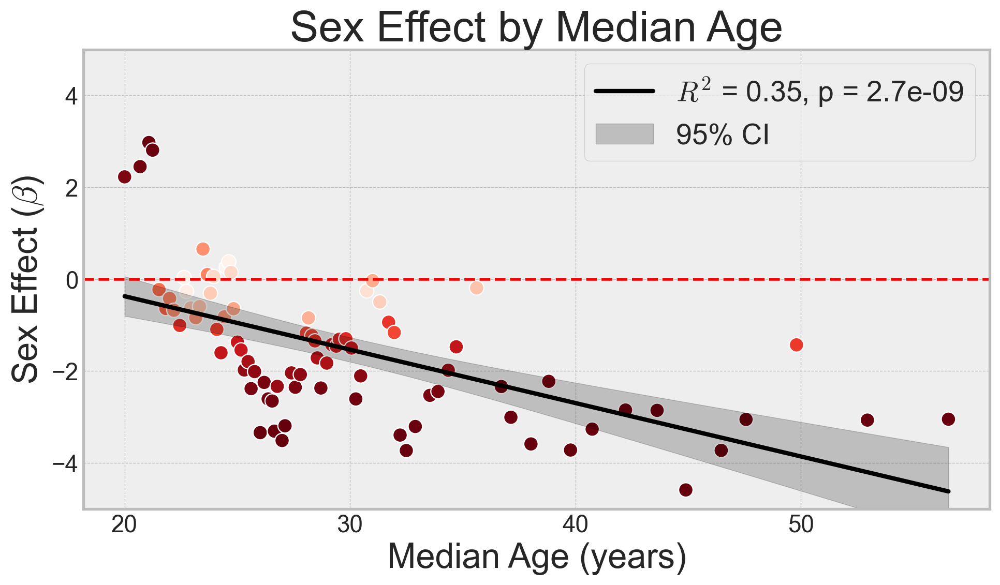

In [ ]:
pr = model.get_prediction(pred_df)
ci = pr.conf_int(alpha=0.05)
pred_df["beta_fit"] = pr.predicted_mean
pred_df["beta_lo"] = ci[:, 0]
pred_df["beta_hi"] = ci[:, 1]

fig, ax = plt.subplots(figsize=(10, 6))
# sns.regplot(data=bins_df.astype(float), x="median_age", y="r", ax=ax, scatter=False, color="black", label="Regression Line")
sns.scatterplot(
    data=bins_df.astype(float),
    x="median_age",
    # y="beta_mean",
    y="t_mean",
    ax=ax,
    s=100,
    hue="p_median",
    palette="Reds_r",
    legend=False,
)

ax.plot(
    pred_df["median_age"],
    pred_df["beta_fit"],
    color="black",
    label=f"$R^2$ = {model.rsquared_adj:.2f}, p = {model.f_pvalue:.2g}",
    lw=3,
)
ax.fill_between(
    pred_df["median_age"],
    pred_df["beta_lo"],
    pred_df["beta_hi"],
    color="black",
    alpha=0.2,
    label="95% CI",
)
ax.legend(fontsize=20, title_fontsize=24)
ax.set_xlabel("Median Age (years)", fontsize=24)
ax.set_ylabel("Sex Effect ($\\beta$)", fontsize=24)
ax.set_title("Sex Effect by Median Age", fontsize=30)
ax.set_xticks(range(20, 60, 10))
# ax.set_yticks(np.arange(-0.3, 0.3, 0.2))
ax.set_ylim(-5, 5)
ax.axhline(0, color="red", linestyle="--")
# ax.legend(title="p-value", fontsize=20, title_fontsize=24)
plt.tight_layout()
# savefig_nice(
# sns.regplot(data=bins_df.astype(float), x="median_age", y="r")

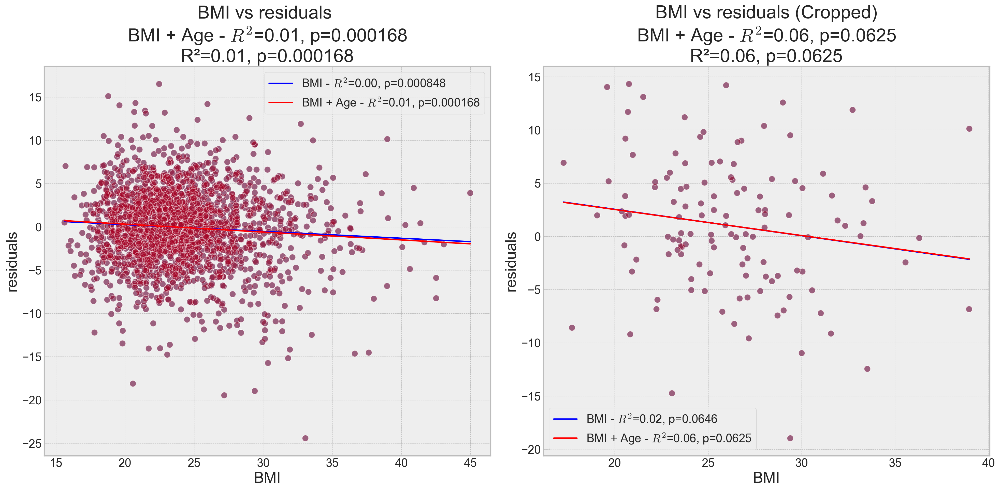

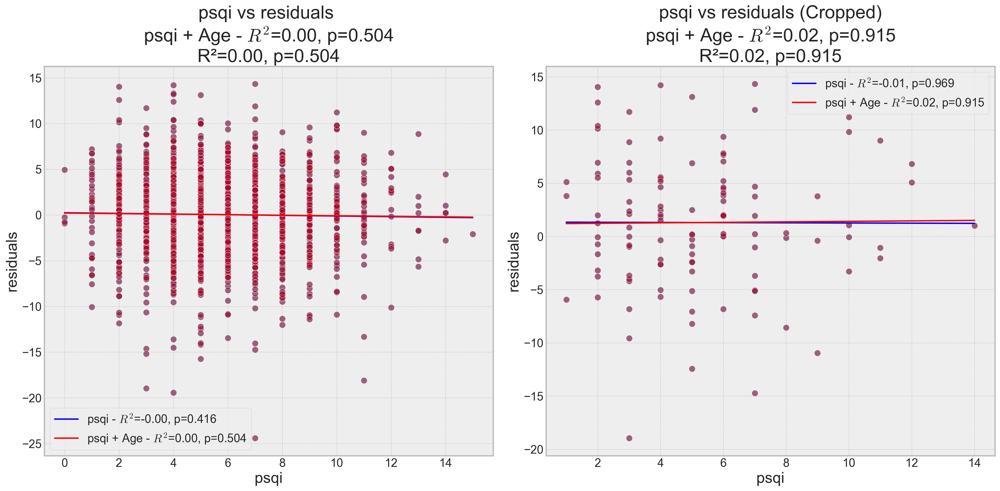

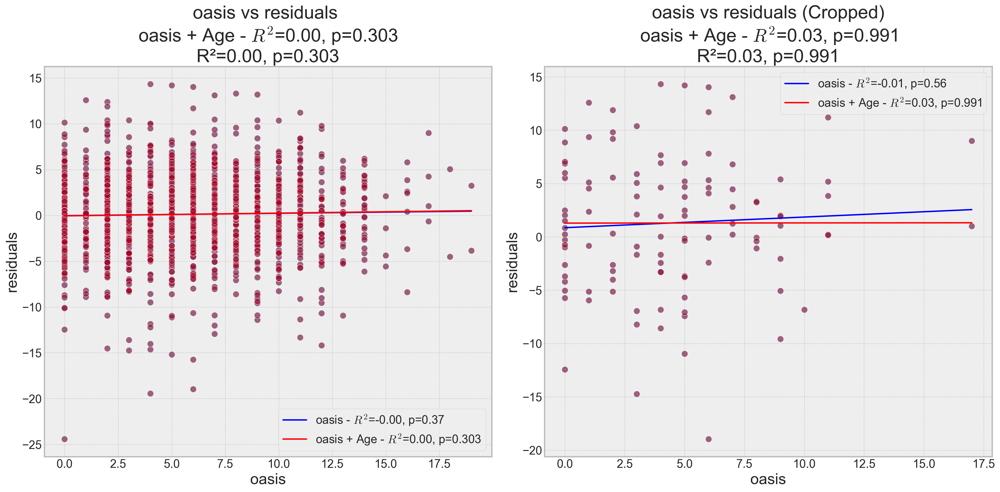

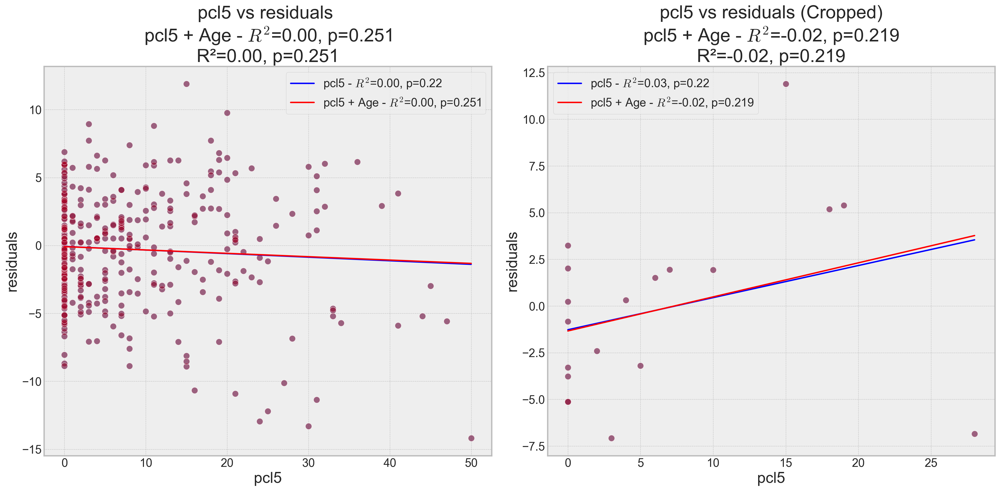

In [ ]:
from scipy import stats
import pingouin as pg
from statsmodels.formula.api import ols

# Results storage
results = []

# Continuous/Ordinal: OLS with/without age correction
for col in [c for c in (categories["continuous"] + categories["ordinal"]) if c in key_measures]:
    if col == "age_at_scan" or col == "age":  # Skip age variables
        continue
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    for crop, ax in zip([False, True], axes):
        if crop:
            cur_df = df[df["age_at_scan"] > 50]
        else:
            cur_df = df.copy()
        # drop missing values
        cur_df = cur_df.dropna(subset=[target, col])
        if cur_df.empty:
            print(f"No data for {col} with crop={crop}")
            continue
        for include_age in [False, True]:
            if include_age:
                model = ols(f"{target} ~ {col} + age", data=cur_df).fit()
                label = f"{col} + Age - $R^2$={model.rsquared_adj:.2f}, p={model.pvalues[col]:.3g}"
            else:
                model = ols(f"{target} ~ {col}", data=cur_df).fit()
                label = f"{col} - $R^2$={model.rsquared_adj:.2f}, p={model.pvalues[col]:.3g}"
            # Get p-value and r-squared
            p_value = model.pvalues[col]
            r_squared = model.rsquared_adj
            # Store results
            results.append(
                {
                    "variable": col,
                    "include_age": include_age,
                    "crop": crop,
                    "p_value": p_value,
                    "r_squared": r_squared,
                }
            )

            # Plot
            sns.scatterplot(data=cur_df, x=col, y=target, ax=ax, alpha=0.5)
            xvals = np.linspace(cur_df[col].min(), cur_df[col].max(), 100)
            pred = model.predict(
                pd.DataFrame(
                    {col: xvals, "age": cur_df["age_at_scan"].mean()}
                    if include_age
                    else {col: xvals}
                )
            )
            ax.plot(xvals, pred, label=label, color="red" if include_age else "blue", lw=2)
            ax.set_title(
                f"{col} vs {target} {'(Cropped)' if crop else ''}\n{label}\nR²={r_squared:.2f}, p={p_value:.3g}"
            )
            ax.set_xlabel(col)
            ax.set_ylabel(target)
            ax.legend()
    plt.tight_layout()

    plt.show()
    # break

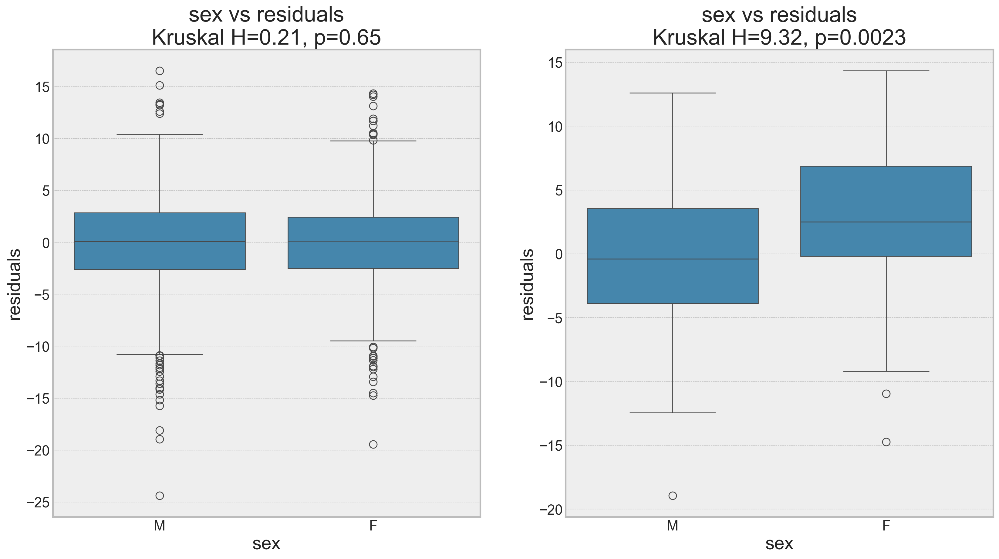

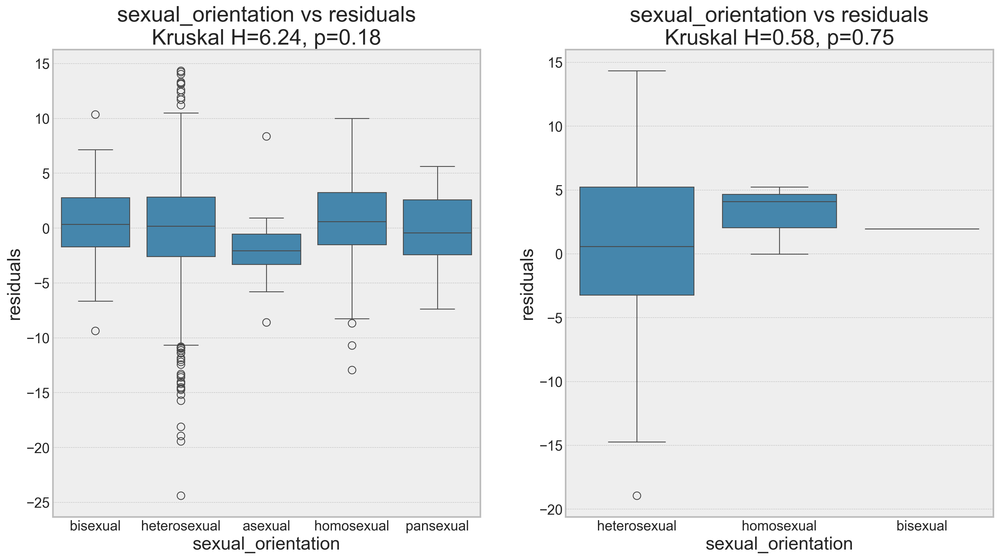

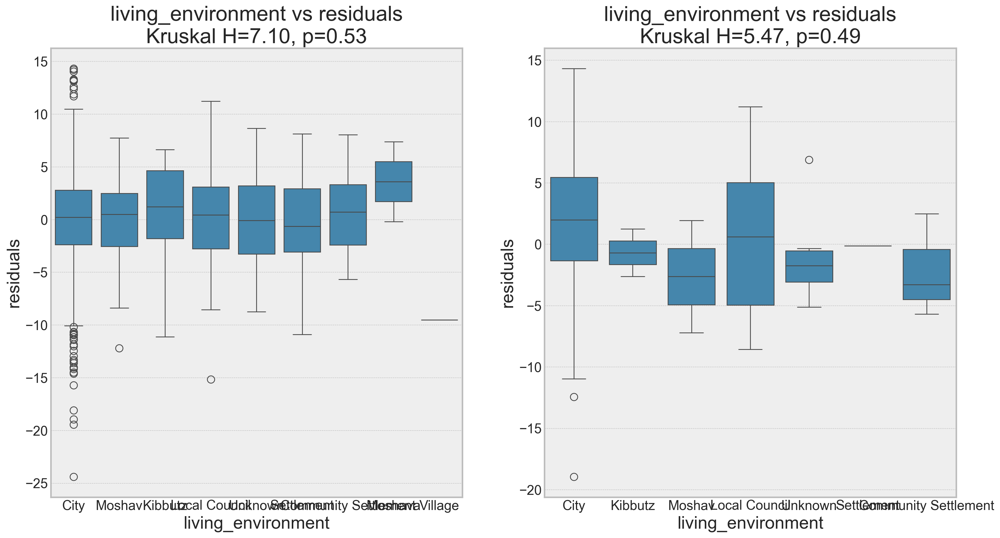

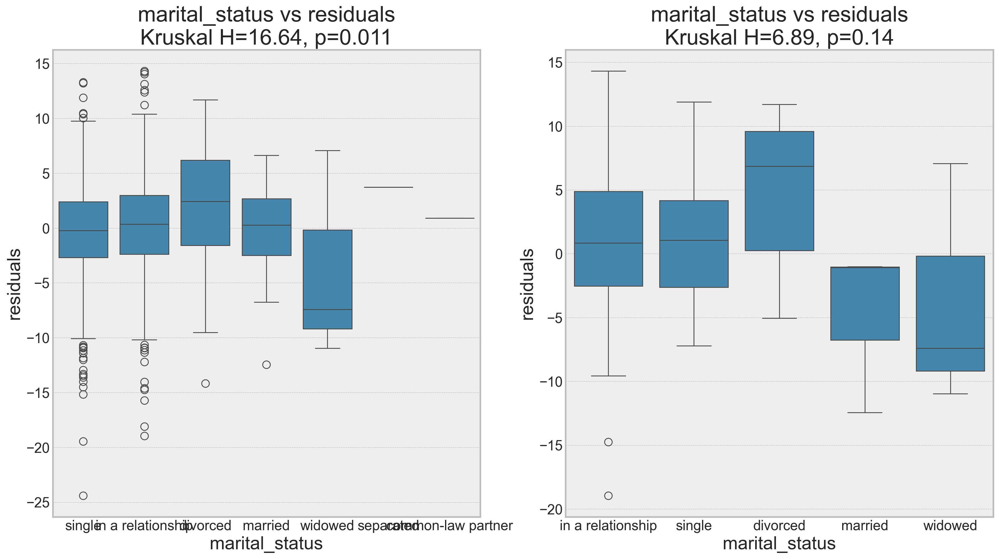

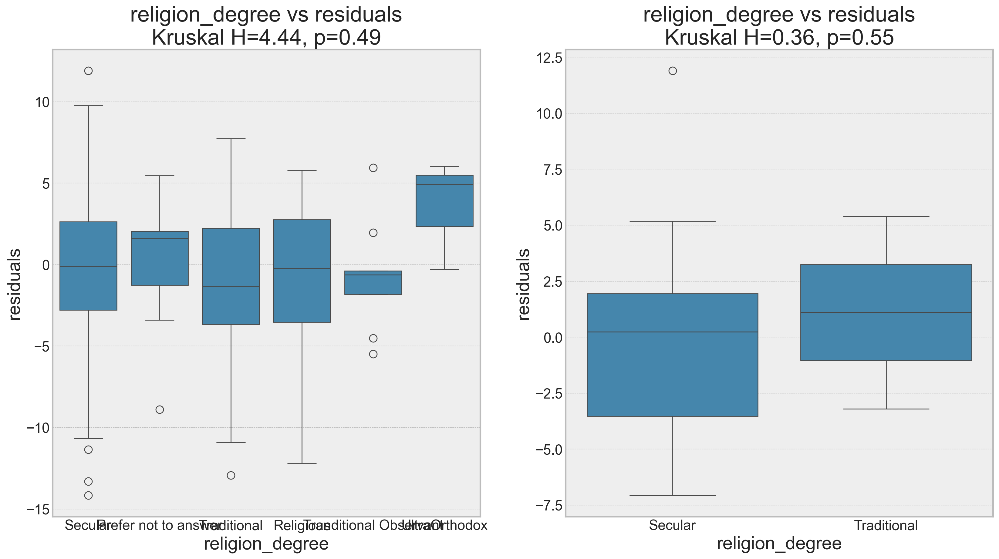

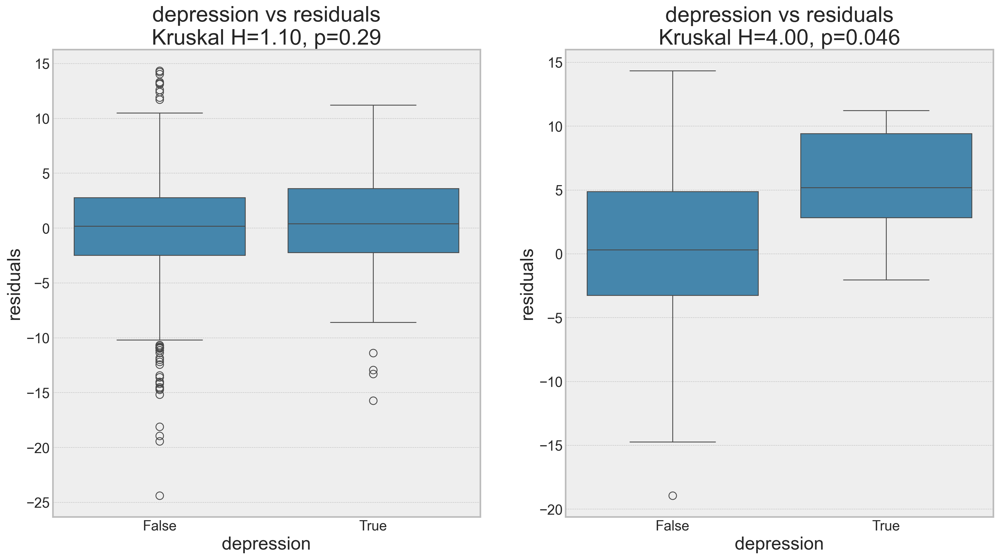

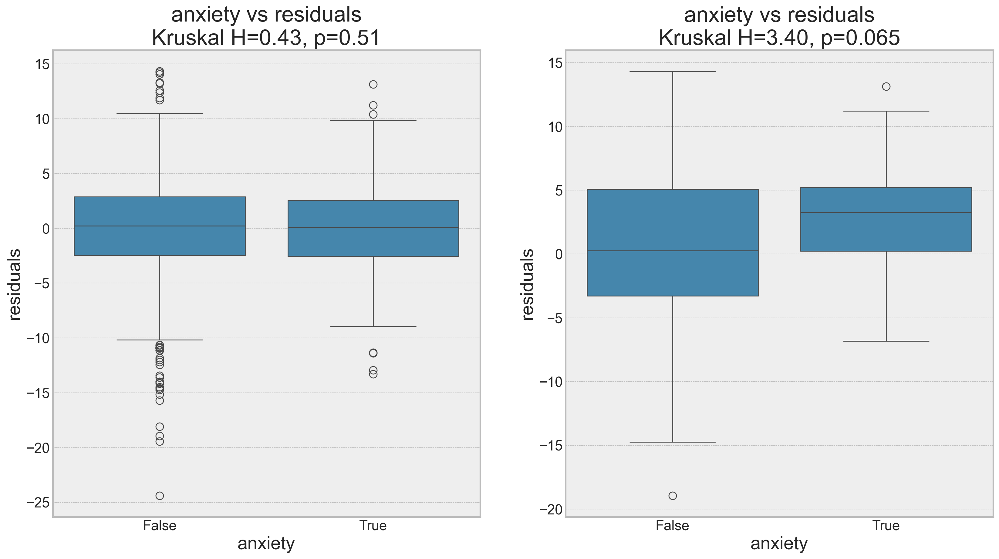

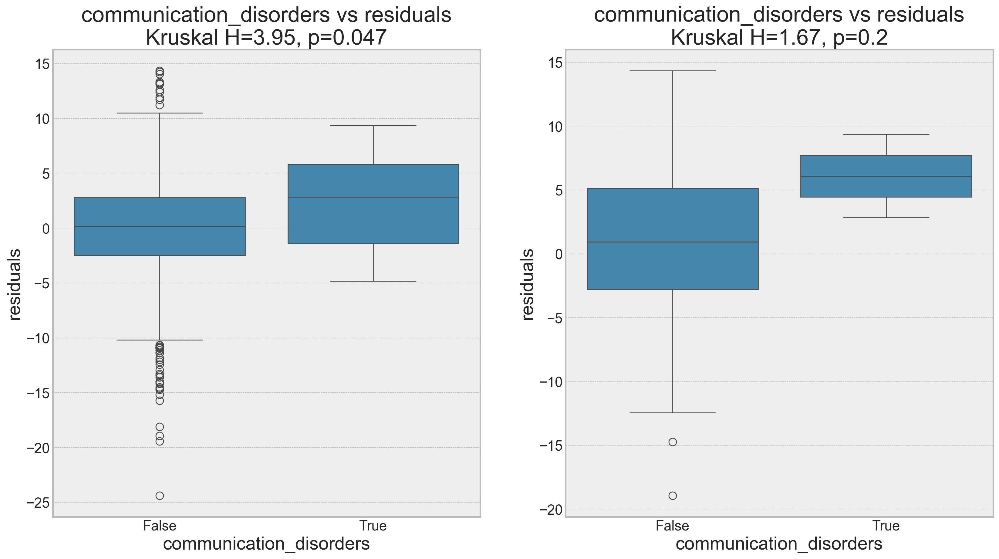

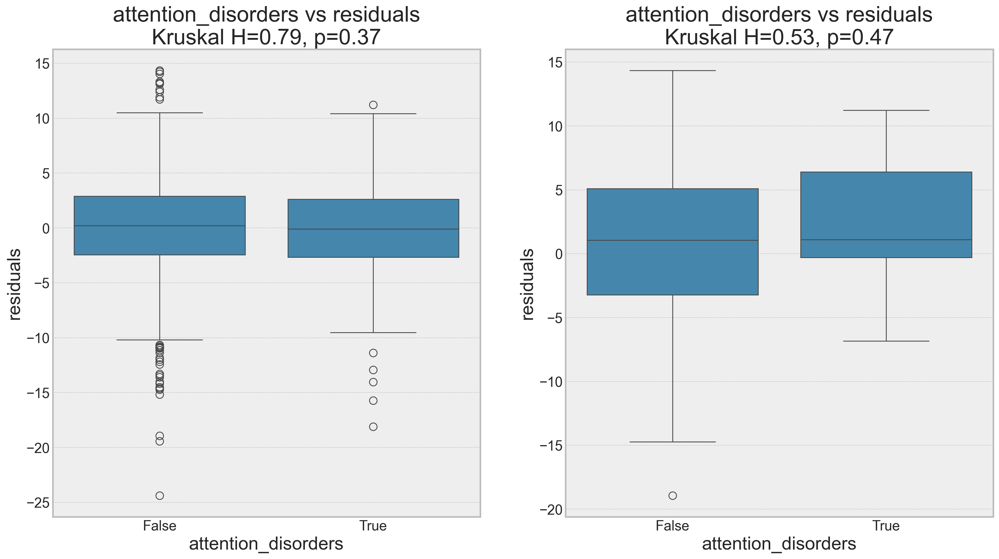

In [ ]:
# Categorical: Kruskal-Wallis for group differences in BAG
for col in [c for c in categories["categorical"] if c in key_measures]:
    fig, axes = plt.subplots(1, 2, figsize=(20, 10))
    for crop, ax in zip([False, True], axes):
        if crop:
            cur_df = df[df["age_at_scan"] > 50]
        else:
            cur_df = df.copy()
        # drop missing values
        cur_df = cur_df[cur_df[col] != "U"]
        cur_df = cur_df.dropna(subset=[target, col])
        unique_groups = cur_df[col].unique()
        if len(unique_groups) < 2:
            continue  # Skip if only one group
        groups = [
            cur_df[cur_df[col] == group][target]
            for group in unique_groups
            if not cur_df[cur_df[col] == group][target].empty
        ]
        if len(groups) < 2 or any(len(g) == 0 for g in groups):
            continue
        kruskal_stat, kruskal_p = stats.kruskal(*groups)
        results.append(
            {
                "variable": col,
                "type": "categorical",
                "kruskal_stat": kruskal_stat,
                "kruskal_p": kruskal_p,
                "groups": unique_groups.tolist(),
            }
        )

        # Visualize
        sns.boxplot(data=cur_df, x=col, y=target, ax=ax)
        ax.set_title(f"{col} vs {target}\nKruskal H={kruskal_stat:.2f}, p={kruskal_p:.2g}")
        ax.set_xlabel(col)
        ax.set_ylabel(target)
    plt.show()

In [ ]:
df_cov.to_csv("covariates.csv", index=False)

In [ ]:
from statsmodels.formula.api import ols, wls

x_col = "salary"
# x_col = "3rd_Hol_Survivor"
# cur_df_cov = df_cov[(df_cov["age"] > 50) & (df_cov[x_col].notna())]
cur_df_cov = df_cov.copy()
# cur_df_cov = cur_df_cov[cur_df_cov["sex"] == "M"]
cov_y = cur_df_cov[x_col].dropna().astype(float)
cov_x = cur_df_cov["residuals"].loc[cov_y.index]
# x = df_cov["age"].loc[y.index]
print(spearmanr(cov_x, cov_y))
print(cov_x.shape)
model = ols(f"{x_col} ~ age+residuals", data=cur_df_cov).fit()
print(model.summary())

KeyError: 'residuals'

In [ ]:
# df_cov.columns

In [ ]:
behav_cols = [
    "Neuro and psychiatric Issues",
    "BloodSugar",
    "PSQI",
    "HLI",
    "BMI",
    "education_level",
]

<Axes: xlabel='brain_health', ylabel='residuals'>

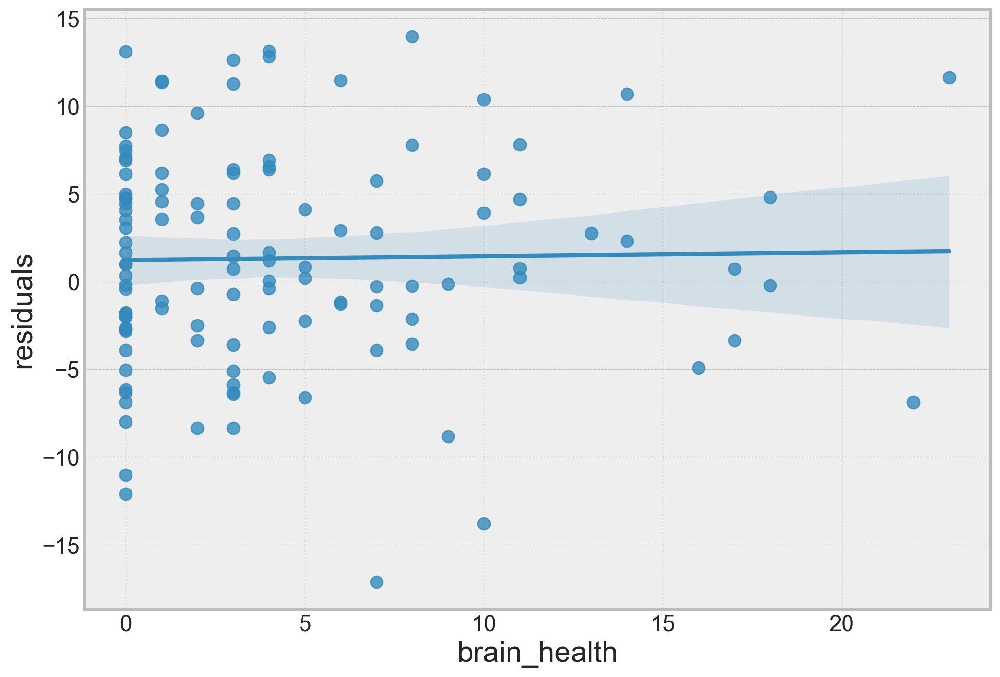

In [ ]:
sns.regplot(x=cov_y, y=cov_x)

In [ ]:
# split fv_cov into groups where each group has 50 subjects, going from the younger to the older subjects
def split_into_groups(df, group_size=50):
    df = df.sort_values("age", ascending=False)
    groups = [df.iloc[i : i + group_size] for i in range(0, len(df), group_size)]
    ages = [group["age"].median() for group in groups]
    return ages, groups


df_test = df_cov[df_cov[x_col].notna()]

ages, groups = split_into_groups(df_test)

bins_df = pd.DataFrame(
    columns=[
        "median_age",
        "group_size",
        "min_age",
        "max_age",
        f"{x_col}_median",
        "residuals_median",
        "r",
        "p",
    ]
)

for i, (age, group) in enumerate(zip(ages, groups)):
    bins_df.loc[i, "median_age"] = age
    bins_df.loc[i, "group_size"] = len(group)
    bins_df.loc[i, "min_age"] = group["age"].min()
    bins_df.loc[i, "max_age"] = group["age"].max()
    bins_df.loc[i, f"{x_col}_median"] = group[x_col].median()
    bins_df.loc[i, "residuals_median"] = group["residuals"].median()
    # plot the distribution of the x_col in this group
    cur_y = group[x_col].dropna().astype(float)
    cur_x = group["residuals"].loc[cur_y.index]
    # if cur_y is continuous, use spearman correlation
    # if cur_y is categorical, use point-biserial correlation
    # if cur_y is ordinal, use spearman correlation
    # if cur_y is binary, use point-biserial correlation
    if cur_y.nunique() < 10:
        # use point-biserial correlation
        from scipy.stats import pointbiserialr

        r, p = pointbiserialr(cur_x, cur_y)
    else:
        # use spearman correlation
        r, p = spearmanr(cur_x, cur_y)
        # model = ols(f"{x_col} ~ residuals", data=group).fit()
        # r = model.rsquared_adj
        # p = model.f_pvalue
    bins_df.loc[i, "r"] = r
    bins_df.loc[i, "p"] = p


# correlation between quadratic median age and Spearman's ρ
model = ols("r ~ median_age", data=bins_df.astype(float)).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      r   R-squared:                       0.122
Model:                            OLS   Adj. R-squared:                  0.093
Method:                 Least Squares   F-statistic:                     4.174
Date:                Sun, 20 Jul 2025   Prob (F-statistic):             0.0499
Time:                        13:25:51   Log-Likelihood:                 5.7220
No. Observations:                  32   AIC:                            -7.444
Df Residuals:                      30   BIC:                            -4.512
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.1769      0.114      1.559      0.130      -0.055       0.409
median_age    -0.0071      0.003     -2.043      0.050      -0.014      -3e-06
==============================================================================
Omnibus:                       43.203   Durbin-Watson:                   1.828
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              176.356
Skew:                           2.848   Prob(JB):                     5.07e-39
Kurtosis:                      12.991   Cond. No.                         101.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

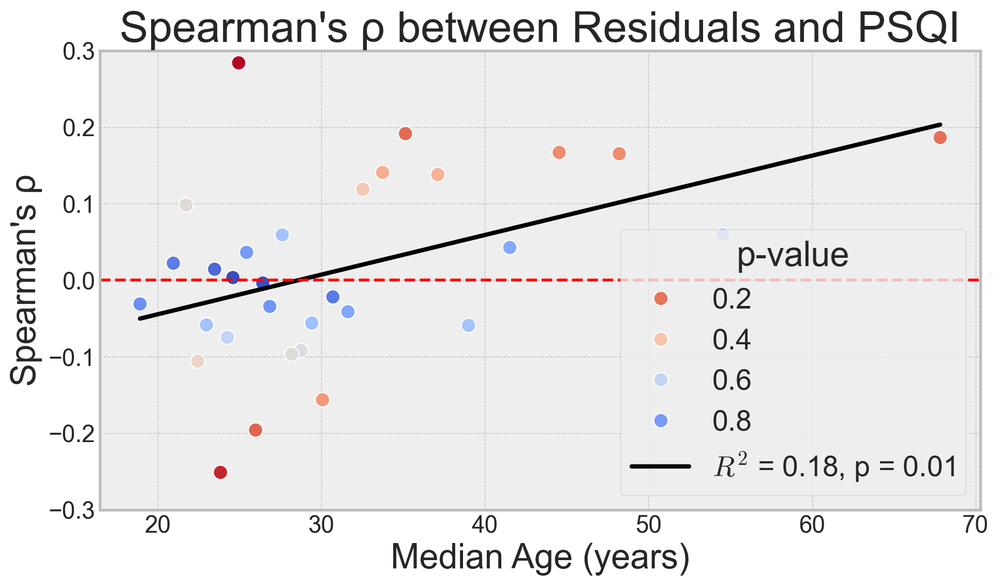

In [ ]:
pred_x = np.linspace(bins_df["median_age"].min(), bins_df["median_age"].max(), 100)
pred_df = pd.DataFrame({"median_age": pred_x})
pred_df["r"] = model.predict(pred_df)

fig, ax = plt.subplots(figsize=(10, 6))
# sns.regplot(data=bins_df.astype(float), x="median_age", y="r", ax=ax, scatter=False, color="black", label="Regression Line")
sns.scatterplot(
    data=bins_df.astype(float), x="median_age", y="r", ax=ax, s=100, hue="p", palette="coolwarm_r"
)
sns.lineplot(
    data=pred_df,
    x="median_age",
    y="r",
    ax=ax,
    color="black",
    lw=3,
    label=f"$R^2$ = {model.rsquared_adj:.2f}, p = {model.f_pvalue:.2g}",
)
ax.set_xlabel("Median Age (years)", fontsize=24)
ax.set_ylabel("Spearman's ρ", fontsize=24)
ax.set_title(f"Spearman's ρ between Residuals and {x_col}", fontsize=30)
ax.set_xticks(range(20, 80, 10))
# ax.set_yticks(np.arange(-0.3, 0.3, 0.2))
ax.set_ylim(-0.3, 0.3)
ax.axhline(0, color="red", linestyle="--")
ax.legend(title="p-value", fontsize=20, title_fontsize=24)
plt.tight_layout()
# savefig_nice(
# sns.regplot(data=bins_df.astype(float), x="median_age", y="r")

<Axes: xlabel='PSQI', ylabel='residuals'>

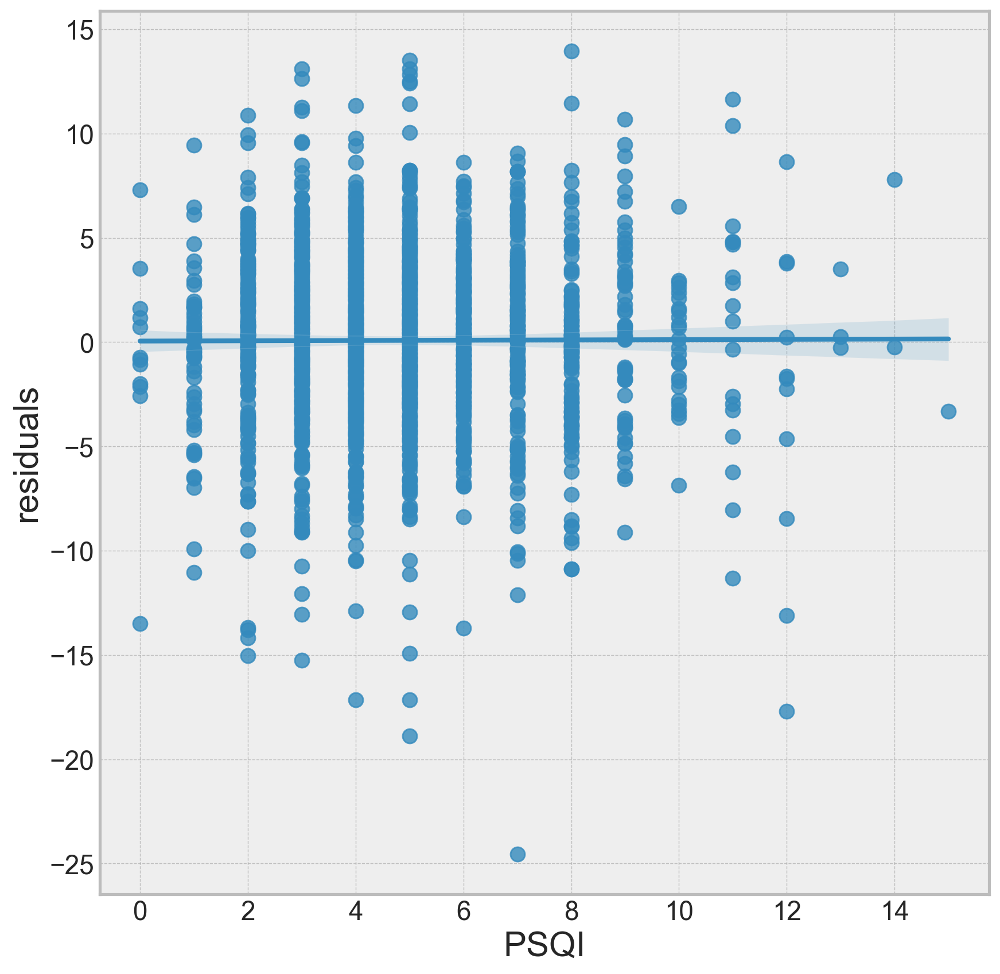

In [ ]:
fig, ax = plt.subplots(figsize=(10, 10))
sns.regplot(x=y, y=x, ax=ax)